In [1]:
import numpy as np
import healpy as hp
# import pymaster as nmt
import matplotlib.pyplot as plt
from astropy.io import fits
from scipy.optimize import curve_fit
import itertools
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2]:
def cl2dl(cl):
    ell = np.arange(len(cl))
    dl = ell*(ell+1)*cl/(2*np.pi)
    return dl

def dl2cl(dl):
    ell = np.arange(2,len(dl))
    cl = dl[2:]*2*np.pi/ell/(ell+1)
    cl = np.insert(cl, 0, [0,0])
    return cl

def variance(cl,fsky):
    ell = np.arange(len(cl))
    return cl*np.sqrt(2/(2*ell+1)*fsky)

def alm_udgrade(map_in, nside_out):
    alm_in = get_alms(map_in)
    lmax_out = 3*nside_out - 1
    alm_out = hp.almxfl(alm_in, np.ones(lmax_out + 1))
    map_out = hp.alm2map(alm_out, nside_out)
    return map_out

def get_alms(map_in):
    nside_in = hp.get_nside(map_in)
    lmax_in = 3*nside_in - 1
    alm = hp.map2alm(map_in, lmax = lmax_in)
    return alm

def get_power(mapp1,mapp2,mask,lmax=None):
    mean1 = np.sum(mapp1*mask)/np.sum(mask)
    mean2 = np.sum(mapp2*mask)/np.sum(mask)
    fsky = np.sum(mask)/mask.shape[0]
    return hp.anafast(mask*(mapp1-mean1),mask*(mapp2-mean2),lmax=lmax)/fsky

In [3]:
noise_dir = '/shared/data/Datasets/I_512_1-10_NoiseBreakout/Simulation/Test/sim0000/'

In [4]:
noise_path = {'30': noise_dir + 'noise_30_map.fits',
              '44': noise_dir + 'noise_44_map.fits',
              '70': noise_dir + 'noise_70_map.fits',
              '100': noise_dir + 'noise_100_map.fits',
              '143': noise_dir + 'noise_143_map.fits',
              '217': noise_dir + 'noise_217_map.fits',
              '353': noise_dir + 'noise_353_map.fits',
              '545': noise_dir + 'noise_545_map.fits',
              '857': noise_dir + 'noise_857_map.fits'}
noise_map = {}
for freq in noise_path:
    noise_map[freq] = hp.read_map(noise_path[freq])

In [3]:
planck_noise_path = {'30' : '/home/yunan/planck_release/ffp10_noise_030_full_map_mc_00000.fits',
                     '100': '/home/yunan/planck_release/ffp10_noise_100_full_map_mc_00000.fits',
                     '143': '/home/yunan/planck_release/ffp10_noise_143_full_map_mc_00000.fits',}
planck_noise_map = {}
for frequency in planck_noise_path:
    planck_noise_map[frequency] = hp.read_map(planck_noise_path[frequency])*10**6

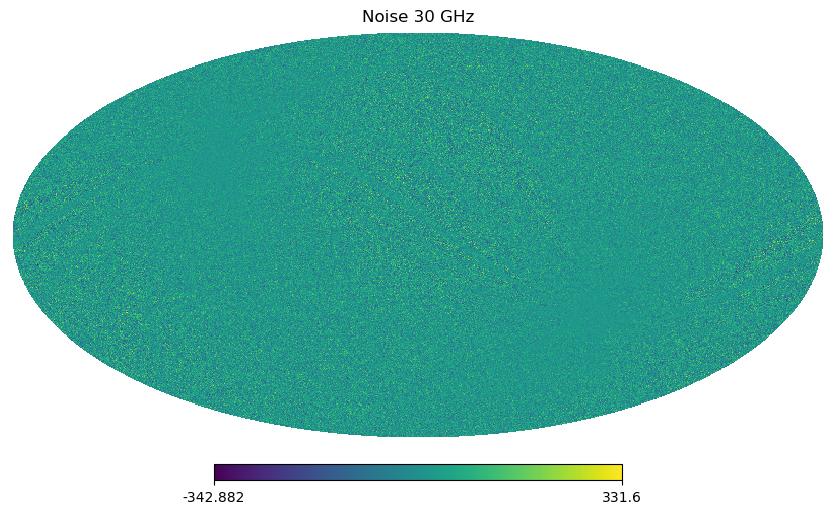

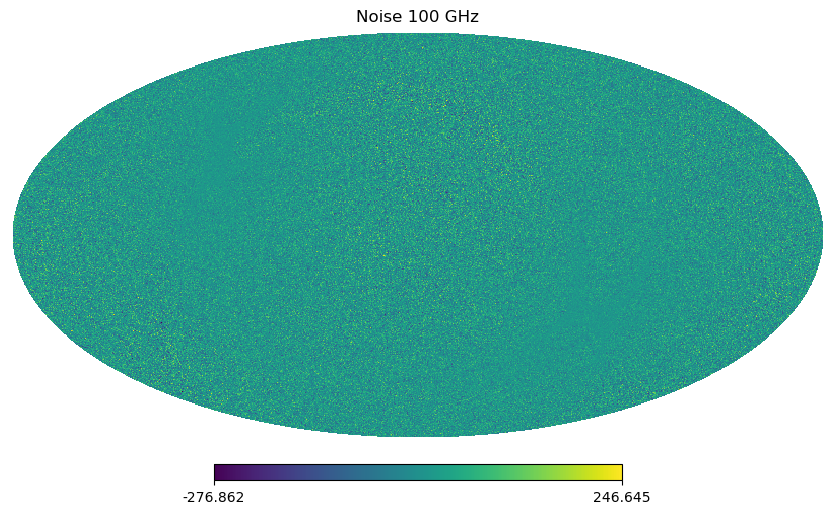

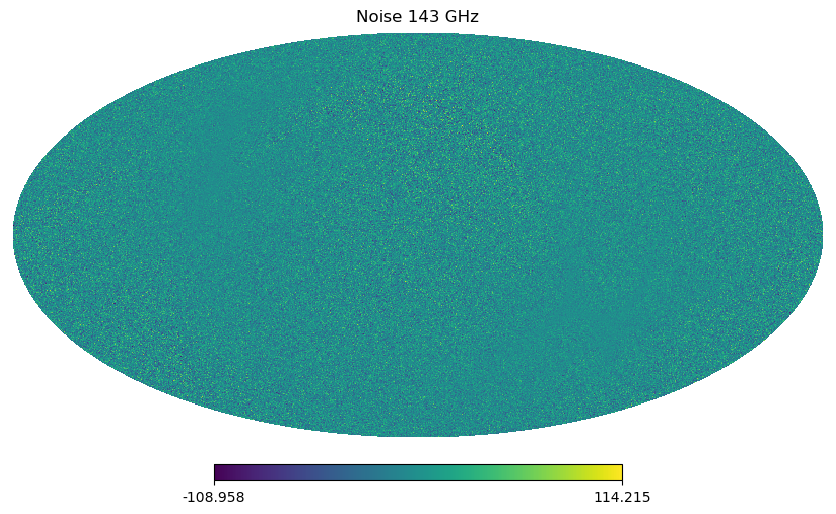

In [4]:
hp.mollview(planck_noise_map['30'], title='Noise 30 GHz')
plt.show()
hp.mollview(planck_noise_map['100'], title='Noise 100 GHz')
plt.show()
hp.mollview(planck_noise_map['143'], title='Noise 143 GHz')
plt.show()

In [6]:
detector_beam = {'30' : 33.102652125,
                 '44' : 27.94348615,
                 '70' : 13.299313,
                 '100': 9.665,
                 '143': 7.303,
                 '217': 5.021,
                 '353': 4.944,
                 '545': 4.831,
                 '857': 4.638
                }

noise_map_decon = {}

frequency_bands = ['30', '44', '70', '100', '143', '217', '353', '545', '857']

# for i, frequency in enumerate(frequency_bands):
#     noise_alm = hp.map2alm(noise_map[frequency], lmax=1535)
#     noise_map_decon[frequency] = hp.alm2map(hp.almxfl(noise_alm, hp.gauss_beam(detector_beam[frequency]*np.pi/(180*60), 1535)), nside=512)

In [18]:
noise_spectra = {}
for frequency in frequency_bands:
    noise_spectra[frequency] = hp.anafast(noise_map[frequency])

NameError: name 'frequency_bands' is not defined

In [4]:
frequencys = [100, 143]
# hp.mollview(planck_noise_map[f'{frequency}'], title=f'Planck Noise {frequency} GHz')
# hp.mollview(noise_map[f'{frequency}'], title=f'Noise {frequency} GHz')
#hp.mollview(noise_map_decon[f'{frequency}'], title=f'Deconvolved Noise {frequency} GHz')

In [5]:
planck_noise_spectra = {}
for frequency in frequencys:
    planck_noise_spectra[f'{frequency}'] = hp.anafast(planck_noise_map[f'{frequency}'])

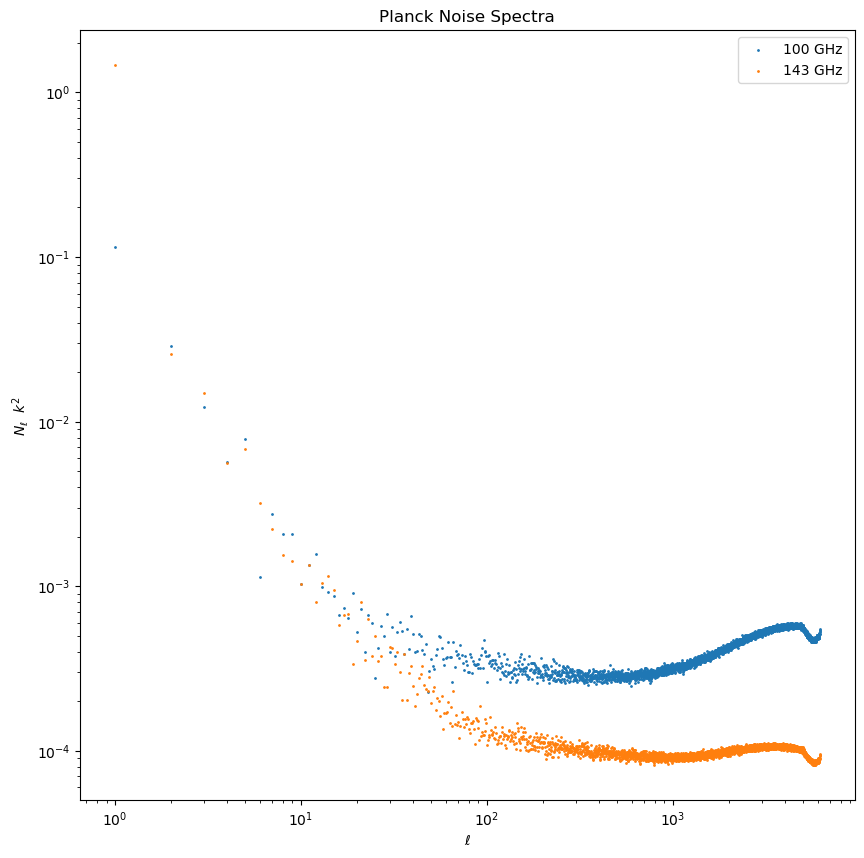

In [7]:
ell = np.arange(len(planck_noise_spectra[f'{frequencys[0]}']))
plt.figure(figsize=(10, 10))
for frequency in frequencys:
    plt.scatter(ell, planck_noise_spectra[f'{frequency}'], label=f'{frequency} GHz', s = 1)
plt.legend()
plt.yscale('log')
plt.xscale('log')
plt.xlabel('$\ell$')
plt.ylabel('$N_{\ell}$  $k^2$ ')
plt.title('Planck Noise Spectra')
plt.show()


In [11]:
def noise_model(ell, a, b, c):
    return a*(1 + (c/ell)**b)

ellmax = 1000

# Fix: Use ell[:ellmax] and planck_noise_spectra[f'{frequencys[0]}'][:ellmax] to provide arrays
popt, pcov = curve_fit(noise_model, ell[1:ellmax], planck_noise_spectra[f'{frequencys[0]}'][1:ellmax], maxfev=1000000)


/tmp/ipykernel_72026/3161483444.py:2: RuntimeWarning: divide by zero encountered in divide
  return a*(1 + (c/ell)**b)


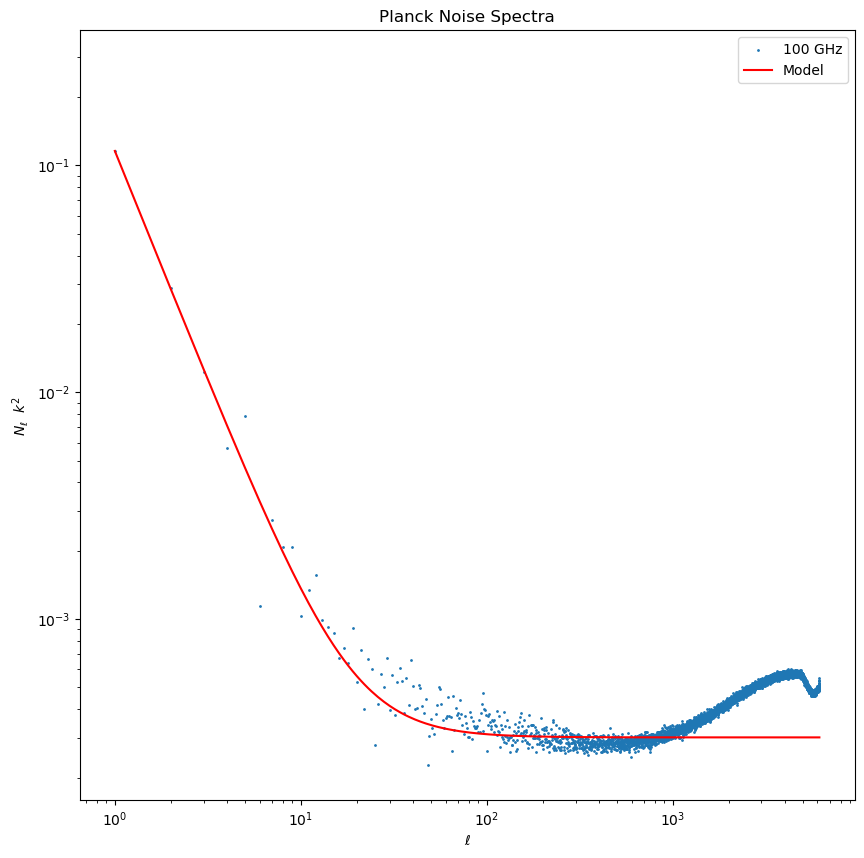

In [12]:
plt.figure(figsize=(10, 10))
plt.scatter(ell, planck_noise_spectra[f'{frequencys[0]}'], label=f'{frequencys[0]} GHz', s = 1)
plt.plot(ell, noise_model(ell, *popt), label='Model', color='red')
plt.legend()
plt.yscale('log')
plt.xscale('log')
plt.xlabel('$\ell$')
plt.ylabel('$N_{\ell}$  $k^2$ ')
plt.title('Planck Noise Spectra')
plt.show()

In [13]:
print(popt)

[3.01124401e-04 2.03481394e+00 1.86024866e+01]


In [18]:
def polynomial_noise_model(ell, a, b, c, d, e, f, g, h, i, j, k):
    return  a + b*ell + c*ell**2 + d*ell**3 + e*(1/ell) + f*(1/ell)**2 + g*(1/ell)**3 + h*ell**4 + i*(1/ell)**4 + j*(1/ell)**5 + k*ell**5

ellmax = len(ell)
popt, pcov = curve_fit(polynomial_noise_model, ell[1:ellmax], planck_noise_spectra[f'{frequencys[0]}'][1:ellmax], maxfev=1000000)
print(popt)

[ 2.78944589e-04 -1.30456684e-08  5.17709364e-11  3.84112089e-16
  3.26953875e-03  9.79052767e-02 -7.86272895e-02 -3.34426144e-18
  2.94581163e-01 -2.01740118e-01  3.42840795e-22]


In [24]:
#take the square root of the diagonal of the covariance matrix to get the standard deviation of the parameters
perr = np.sqrt(np.diag(pcov))
print(perr)

[8.42822673e-06 2.12668186e-08 1.89678266e-11 7.32201873e-15
 6.65373038e-04 1.00995177e-02 4.93691459e-02 1.26039613e-18
 8.78925181e-02 4.80226321e-02 7.93797493e-23]


/tmp/ipykernel_80487/412330292.py:2: RuntimeWarning: divide by zero encountered in divide
  return  a + b*ell + c*ell**2 + d*ell**3 + e*(1/ell) + f*(1/ell)**2 + g*(1/ell)**3 + h*ell**4 + i*(1/ell)**4 + j*(1/ell)**5 + k*ell**5
/tmp/ipykernel_80487/412330292.py:2: RuntimeWarning: invalid value encountered in add
  return  a + b*ell + c*ell**2 + d*ell**3 + e*(1/ell) + f*(1/ell)**2 + g*(1/ell)**3 + h*ell**4 + i*(1/ell)**4 + j*(1/ell)**5 + k*ell**5


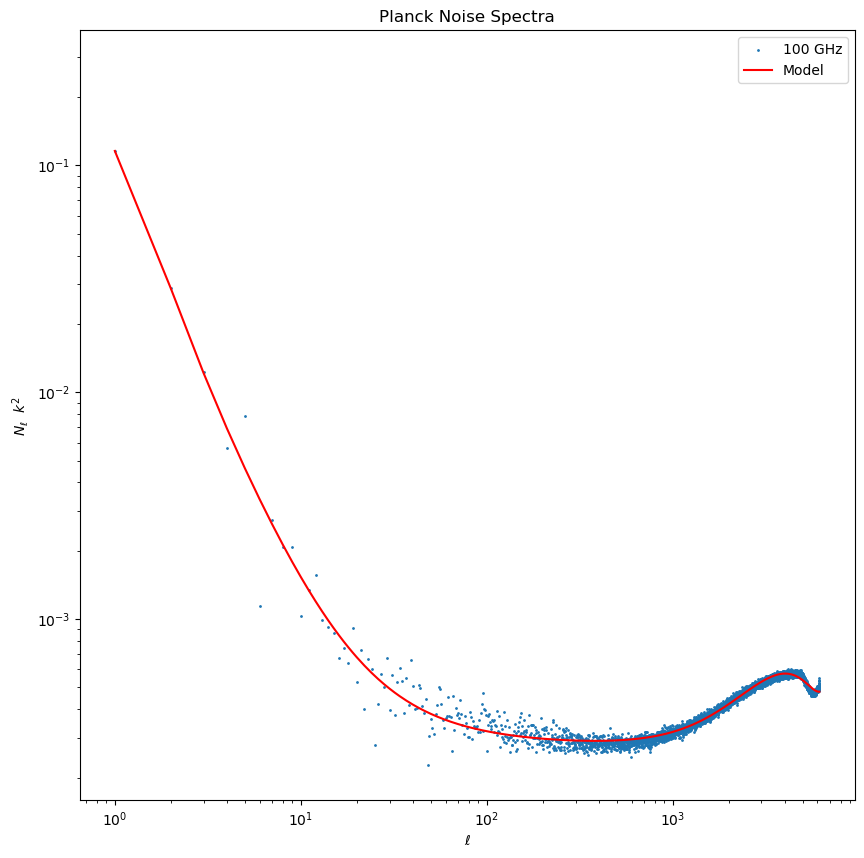

In [19]:
plt.figure(figsize=(10, 10))
plt.scatter(ell, planck_noise_spectra[f'{frequencys[0]}'], label=f'{frequencys[0]} GHz', s = 1)
plt.plot(ell, polynomial_noise_model(ell, *popt), label='Model', color='red')
plt.legend()
plt.yscale('log')
plt.xscale('log')
plt.xlabel('$\ell$')
plt.ylabel('$N_{\ell}$  $k^2$ ')
plt.title('Planck Noise Spectra')
plt.show()


In [22]:
reproduced_noise_map = {}
for frequency in frequencys:
    reproduced_noise_map[f'{frequency}'] = hp.synfast(planck_noise_spectra[f'{frequency}'], nside=2048)

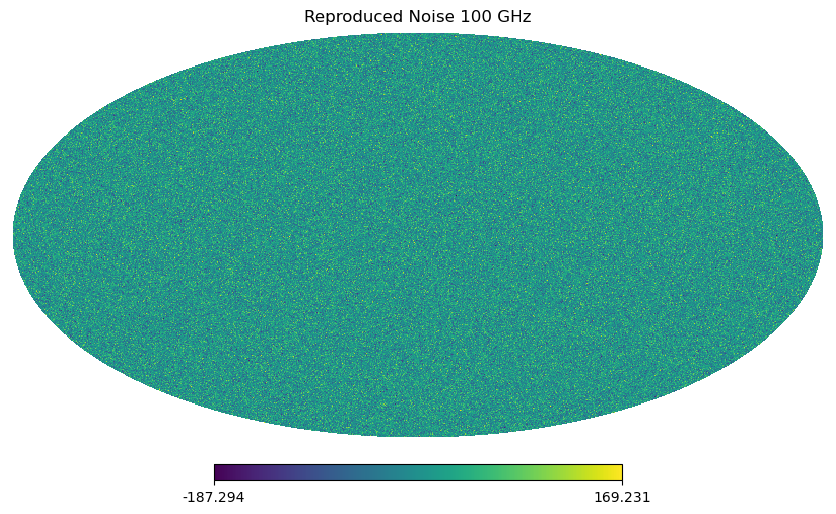

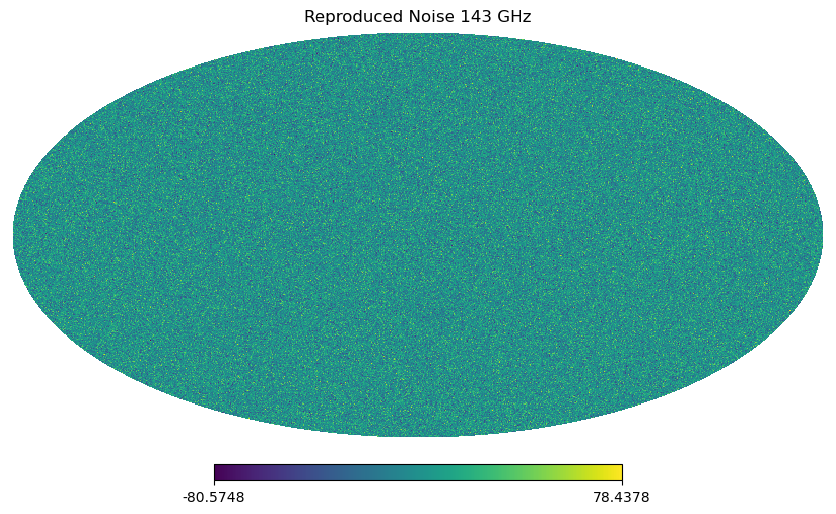

In [13]:
hp.mollview(reproduced_noise_map['100'], title=f'Reproduced Noise 100 GHz')
plt.show()
hp.mollview(reproduced_noise_map['143'], title=f'Reproduced Noise 143 GHz')
plt.show()


In [14]:
noise_map_diff = {}
for frequency in frequencys:
    noise_map_diff[f'{frequency}'] = planck_noise_map[f'{frequency}'] - reproduced_noise_map[f'{frequency}']

<Figure size 1000x1000 with 0 Axes>

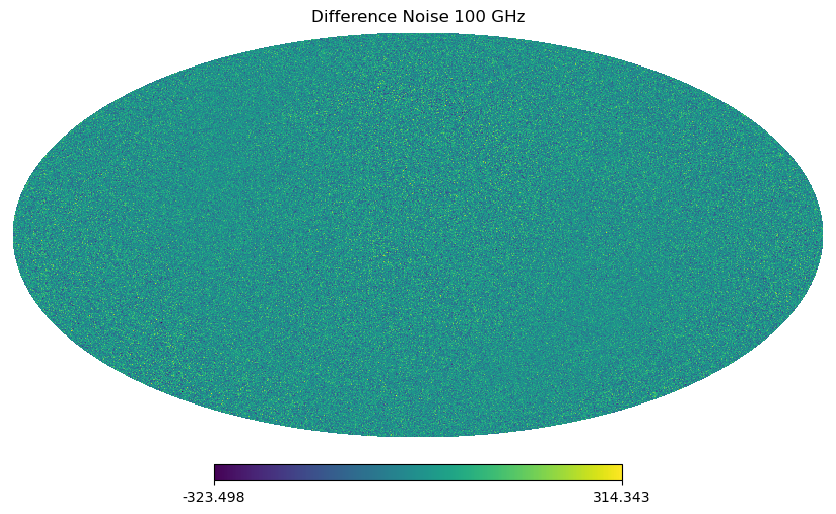

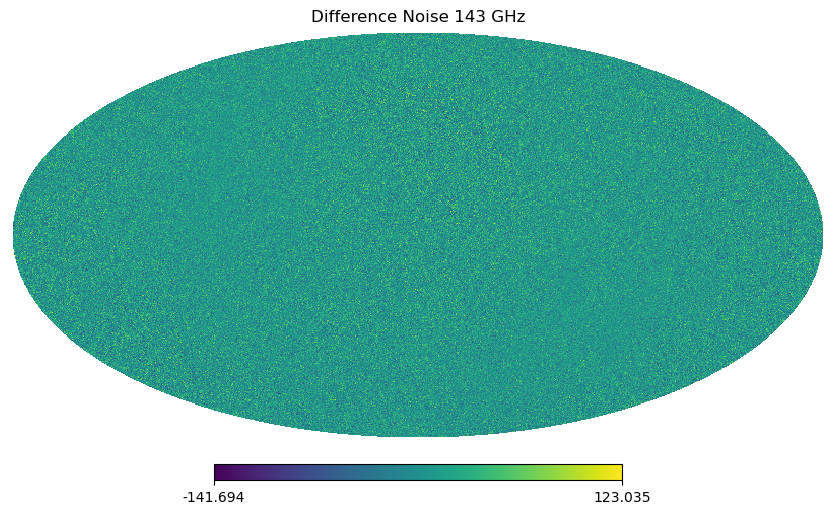

In [15]:
plt.figure(figsize=(10, 10))
for frequency in frequencys:
    hp.mollview(noise_map_diff[f'{frequency}'], title=f'Difference Noise {frequency} GHz')
plt.show()


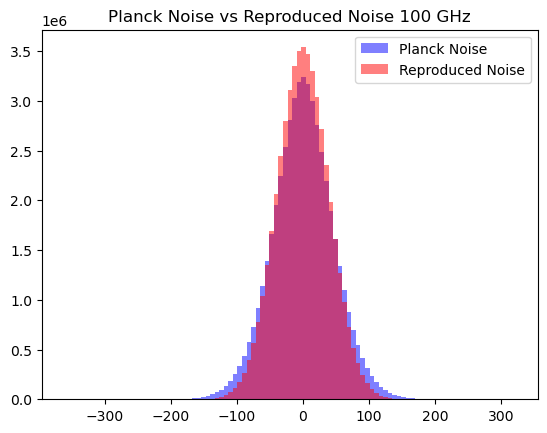

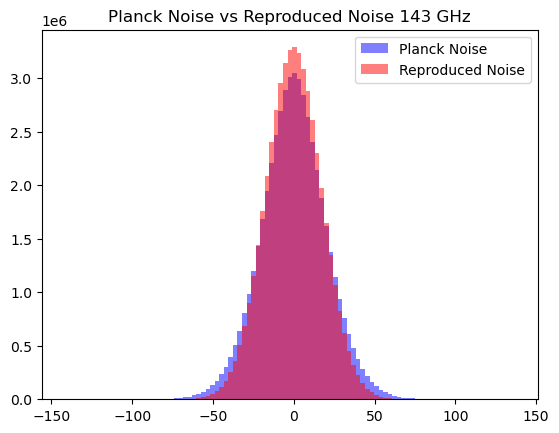

In [25]:
from typing import List

class Record:
    def __init__(self, sky, label, color):
        self.sky = sky
        self.label = label
        self.color = color

class Records:
    def __init__(self, records):
        self.records = records

    def get(self, name):
        return self.records[name]

def make_histograms(records: Records, record_names_to_use: List[str], n_bins=100, title="Histogram of Noise Maps by Pixel Count"):
    oal_min = None
    oal_max = None
    for use_this in record_names_to_use:
        this_sky = records.get(use_this).sky
        this_min = this_sky.min()
        this_max = this_sky.max()
        oal_min = this_min if oal_min is None else min(oal_min, this_min)
        oal_max = this_max if oal_max is None else max(oal_max, this_max)
    bins = np.linspace(oal_min, oal_max, n_bins)

    plt.figure()
    for use_this in record_names_to_use:
        rec = records.get(use_this)
        plt.hist(rec.sky, bins=bins, alpha=0.5, label=rec.label, color=rec.color)
    plt.legend()
    plt.title(title)
    plt.show()

# Example usage
frequencies = [30, 44, 70, 100, 143, 217, 353, 545, 857]


for frequency in frequencies:
    if str(frequency) in planck_noise_map and str(frequency) in reproduced_noise_map:
        combined_records = Records({
            'Planck Noise': Record(planck_noise_map[str(frequency)], 'Planck Noise', 'blue'),
            'Reproduced Noise': Record(reproduced_noise_map[str(frequency)], 'Reproduced Noise', 'red')
        })
        make_histograms(combined_records, ['Planck Noise', 'Reproduced Noise'], 100, f'Planck Noise vs Reproduced Noise {frequency} GHz')

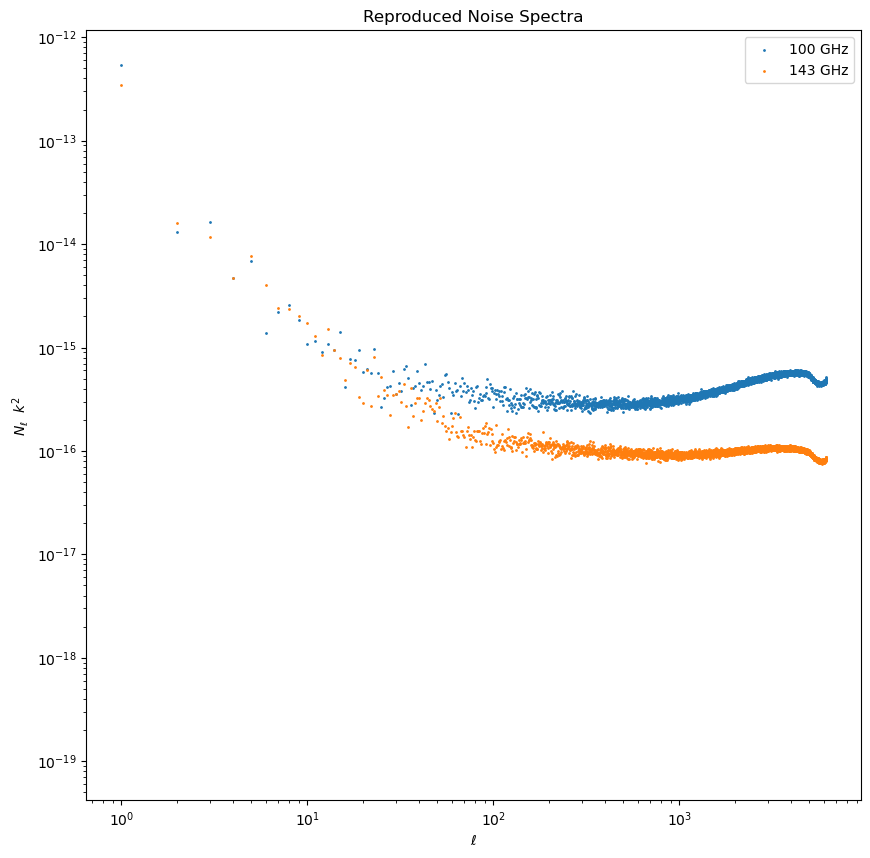

In [22]:
reproduced_noise_spectra = {}
for frequency in frequencys:
    reproduced_noise_spectra[f'{frequency}'] = hp.anafast(reproduced_noise_map[f'{frequency}'])

ell = np.arange(len(reproduced_noise_spectra[f'{frequencys[0]}']))
plt.figure(figsize=(10, 10))
for frequency in frequencys:
    plt.scatter(ell, reproduced_noise_spectra[f'{frequency}'], label=f'{frequency} GHz', s = 1)
plt.legend()
plt.yscale('log')
plt.xscale('log')
plt.xlabel('$\ell$')
plt.ylabel('$N_{\ell}$  $k^2$ ')
plt.title('Reproduced Noise Spectra')
plt.show()

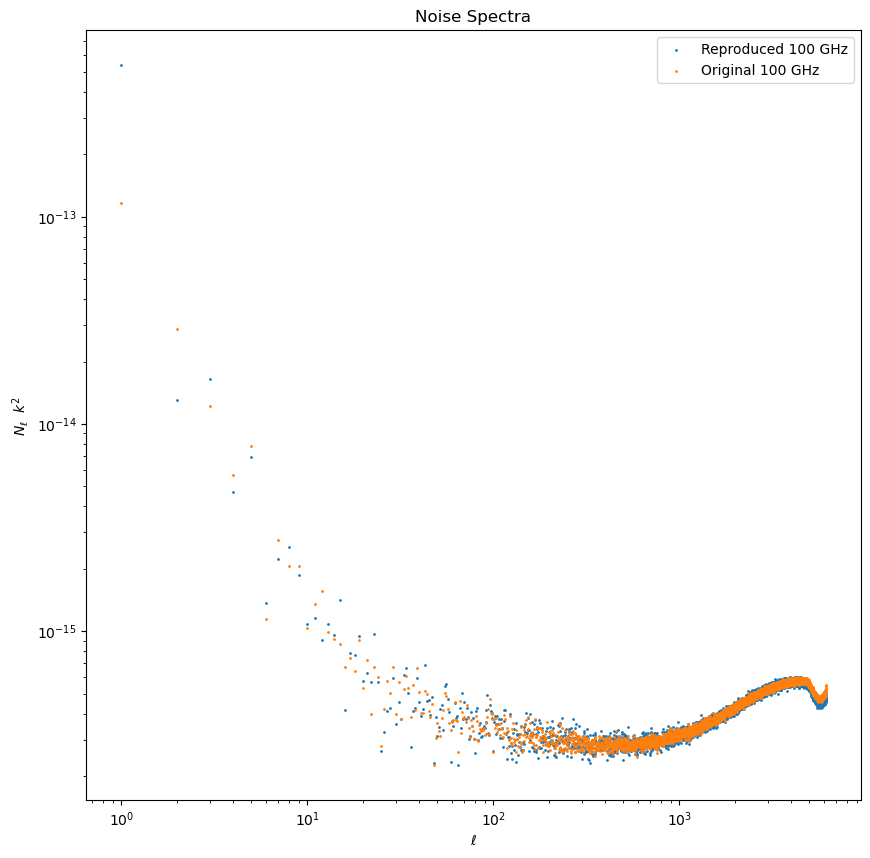

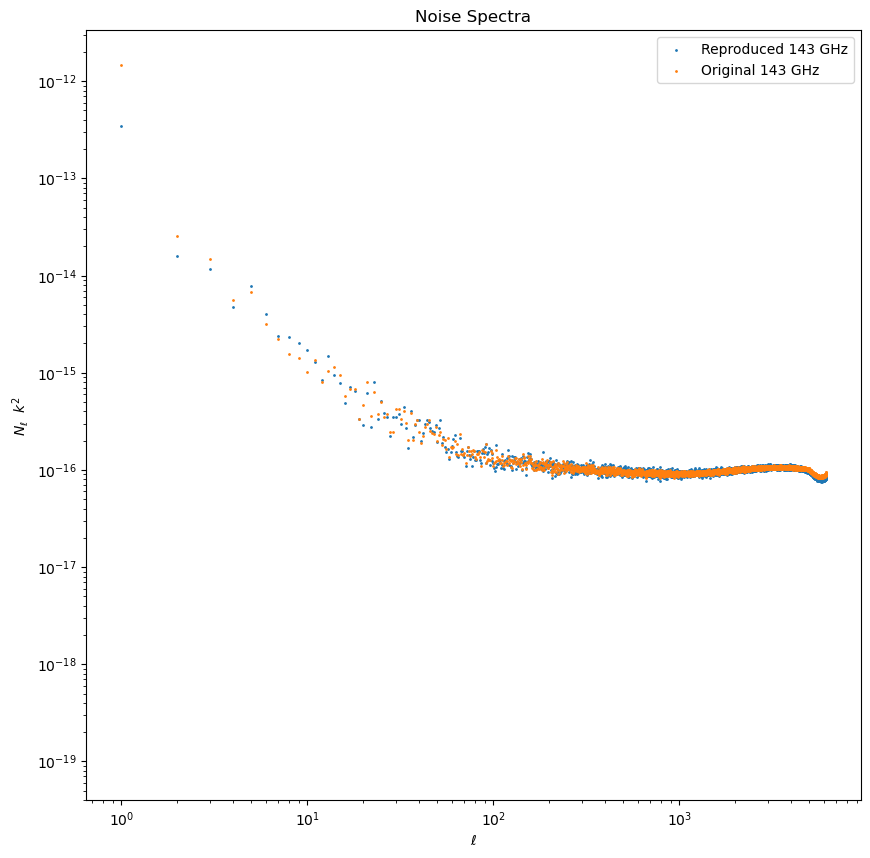

In [23]:
for frequency in frequencys:
    plt.figure(figsize=(10, 10))
    plt.scatter(ell, reproduced_noise_spectra[f'{frequency}'], label=f'Reproduced {frequency} GHz', s = 1)
    plt.scatter(ell, planck_noise_spectra[f'{frequency}'], label=f'Original {frequency} GHz', s = 1)
    plt.legend()
    plt.yscale('log')
    plt.xscale('log')
    plt.xlabel('$\ell$')
    plt.ylabel('$N_{\ell}$  $k^2$ ')
    plt.title('Noise Spectra')
    plt.show()


In [24]:
percentage_diff = {}
for frequency in frequencys:
    percentage_diff[f'{frequency}'] = (reproduced_noise_spectra[f'{frequency}'] - planck_noise_spectra[f'{frequency}'])/planck_noise_spectra[f'{frequency}']


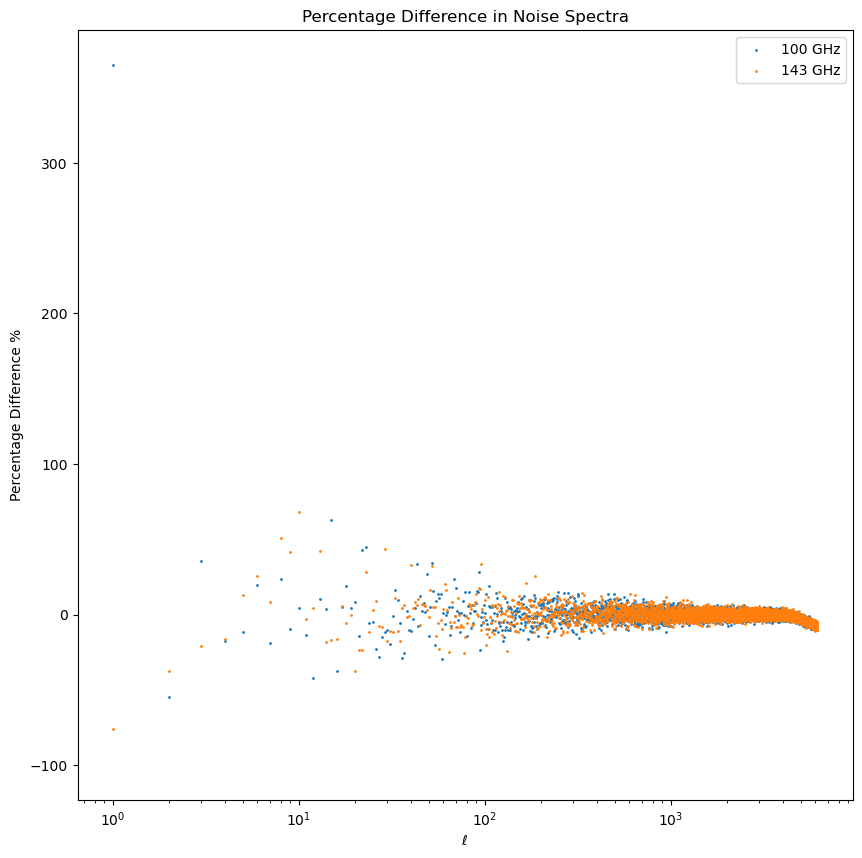

In [26]:
plt.figure(figsize=(10, 10))
for frequency in frequencys:
    plt.scatter(ell, percentage_diff[f'{frequency}']*100, label=f'{frequency} GHz', s = 1)
plt.legend()
plt.yscale('linear')
plt.xscale('log')
plt.xlabel('$\ell$')
plt.ylabel('Percentage Difference %')
plt.title('Percentage Difference in Noise Spectra')
plt.show()


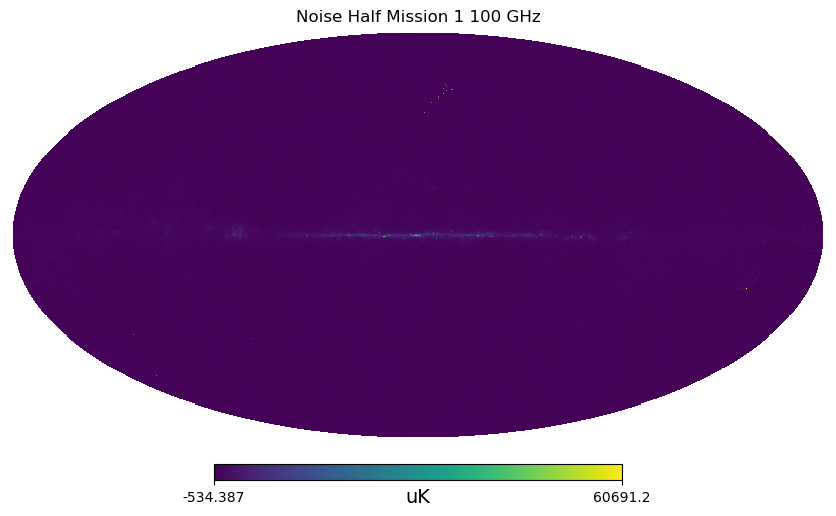

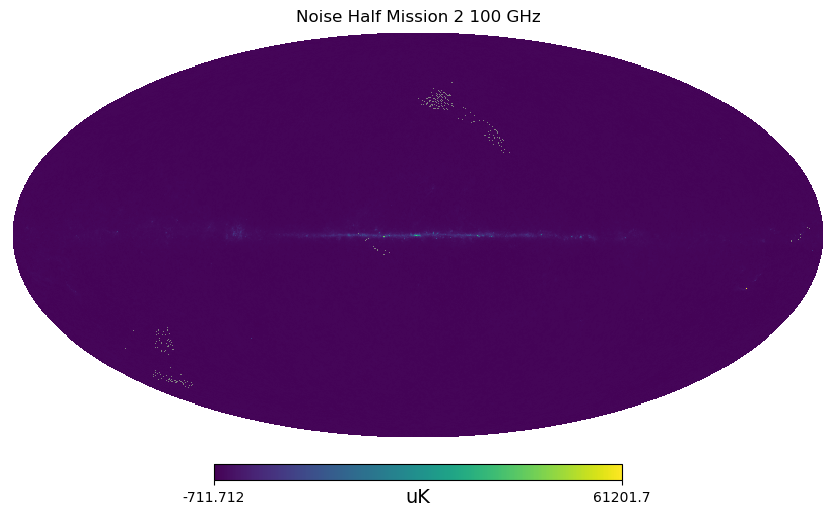

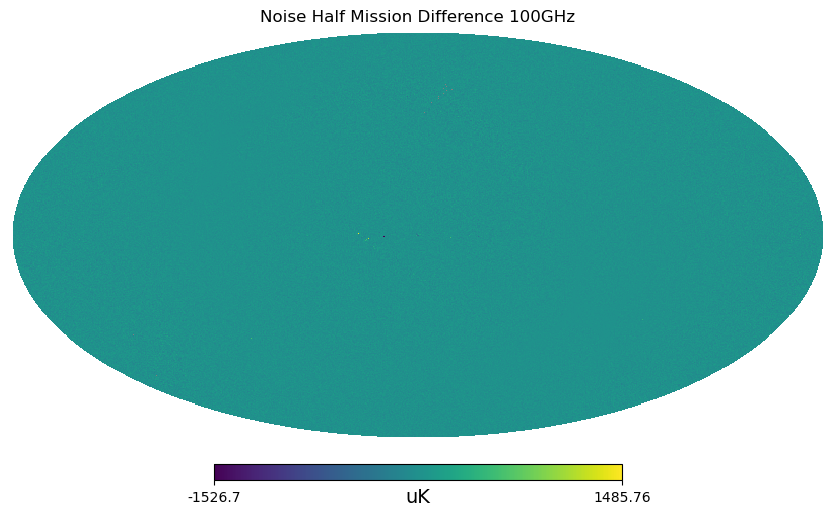

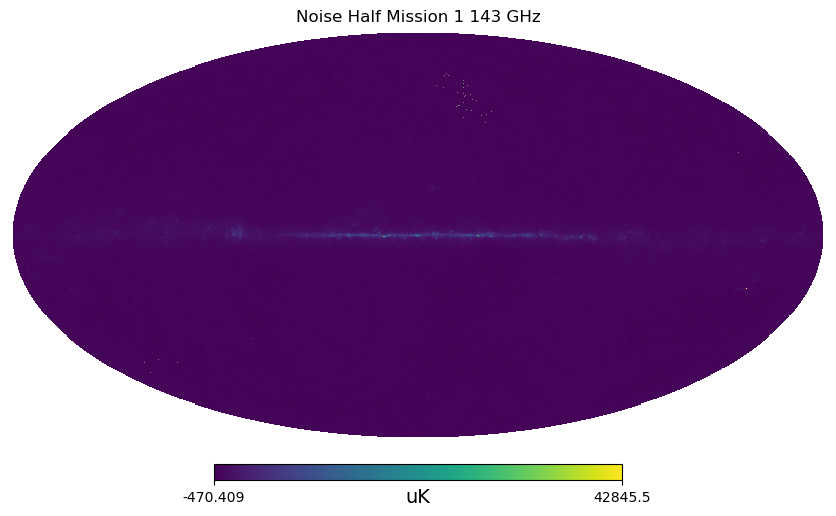

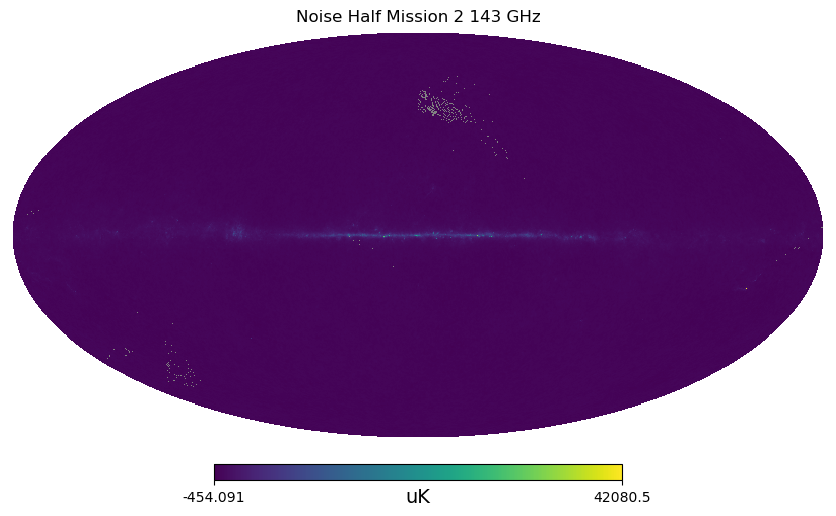

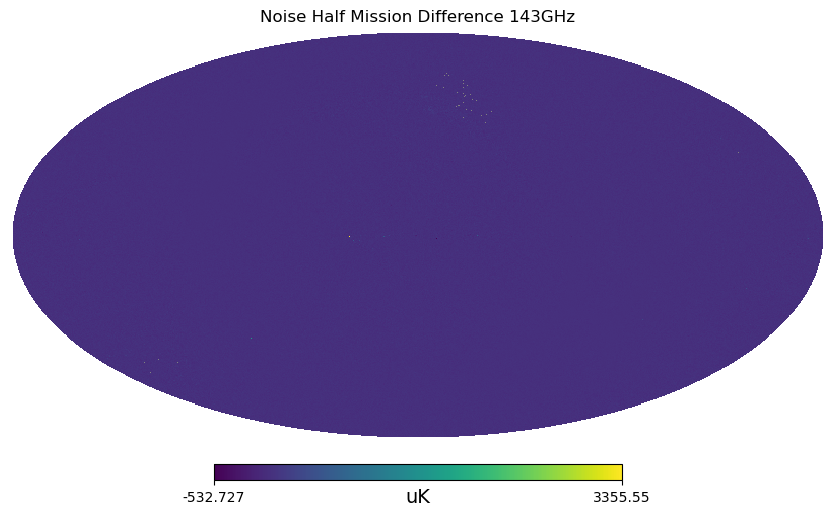

In [48]:
#load half mission noise maps
noise_map_half_mission_1 = {'100': hp.read_map('/home/yunan/planck_release/half_mission/HFI_SkyMap_100_2048_R3.01_halfmission-1.fits'),
                            '143': hp.read_map('/home/yunan/planck_release/half_mission/HFI_SkyMap_143_2048_R3.01_halfmission-1.fits')}
noise_map_half_mission_2 = {'100': hp.read_map('/home/yunan/planck_release/half_mission/HFI_SkyMap_100_2048_R3.01_halfmission-2.fits'),
                            '143': hp.read_map('/home/yunan/planck_release/half_mission/HFI_SkyMap_143_2048_R3.01_halfmission-2.fits')}

noise_map_diff = {}
noise_map_diff_ps = {}
for frequency in frequencys:
    noise_map_half_mission_1[f'{frequency}'] = hp.ma(noise_map_half_mission_1[f'{frequency}'])*10**6
    noise_map_half_mission_2[f'{frequency}'] = hp.ma(noise_map_half_mission_2[f'{frequency}'])*10**6
    hp.mollview(noise_map_half_mission_1[f'{frequency}'], title=f'Noise Half Mission 1 {frequency} GHz', unit='uK')
    hp.mollview(noise_map_half_mission_2[f'{frequency}'], title=f'Noise Half Mission 2 {frequency} GHz', unit='uK')
    noise_map_diff[f'{frequency}'] = hp.ma(noise_map_half_mission_1[f'{frequency}'] - noise_map_half_mission_2[f'{frequency}']) / 2 
    hp.mollview(noise_map_diff[f'{frequency}'], title=f'Noise Half Mission Difference {frequency}GHz', unit='uK')
    plt.show()
    

In [49]:
for frequency in frequencys:
    noise_map_diff_ps[f'{frequency}'] = hp.anafast(noise_map_diff[f'{frequency}'])

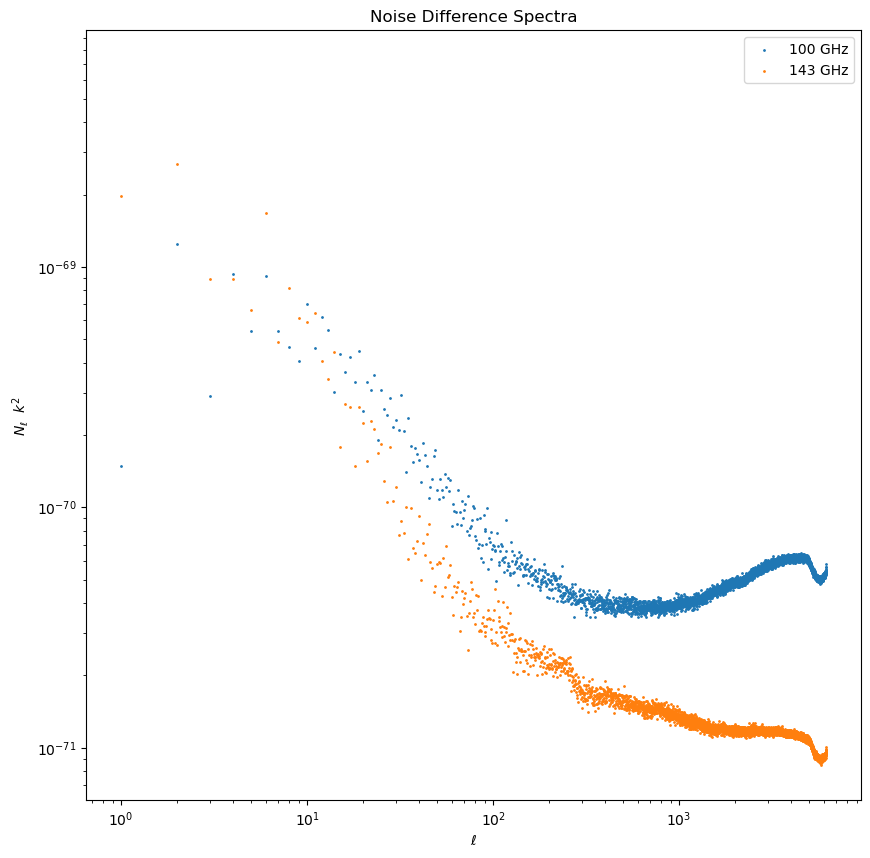

In [50]:
#plot ps
ell = np.arange(len(noise_map_diff_ps[f'{frequencys[0]}']))
plt.figure(figsize=(10, 10))
for frequency in frequencys:
    plt.scatter(ell, noise_map_diff_ps[f'{frequency}']*10**(-67), label=f'{frequency} GHz', s = 1)
plt.legend()
plt.yscale('log')
plt.xscale('log')
plt.xlabel('$\ell$')
plt.ylabel('$N_{\ell}$  $k^2$ ')
plt.title('Noise Difference Spectra')
plt.show()


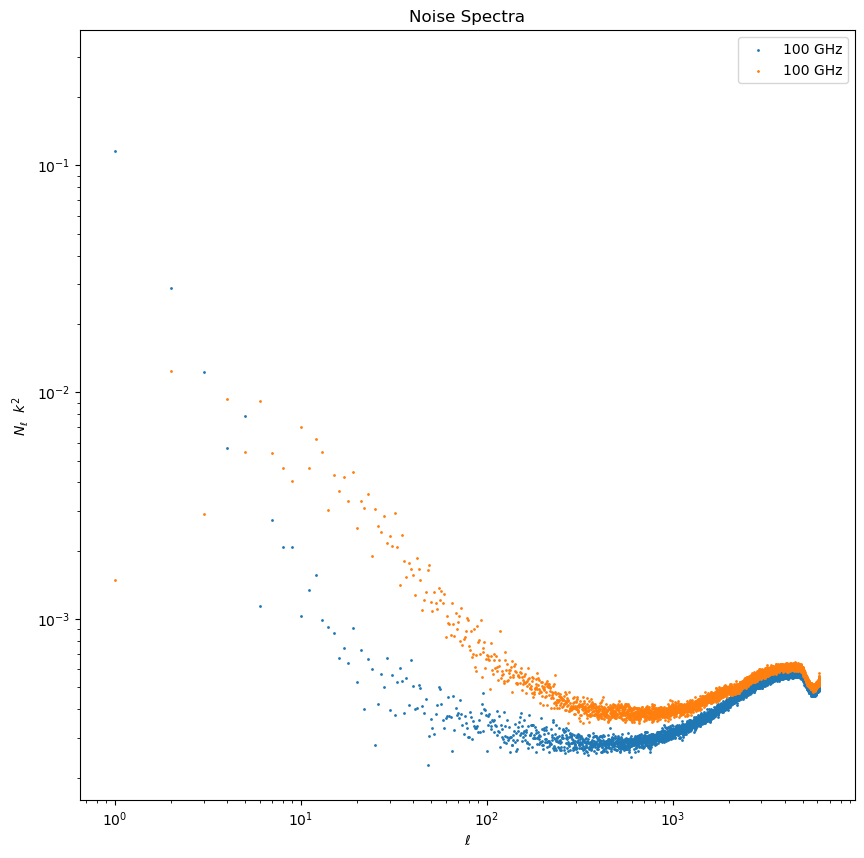

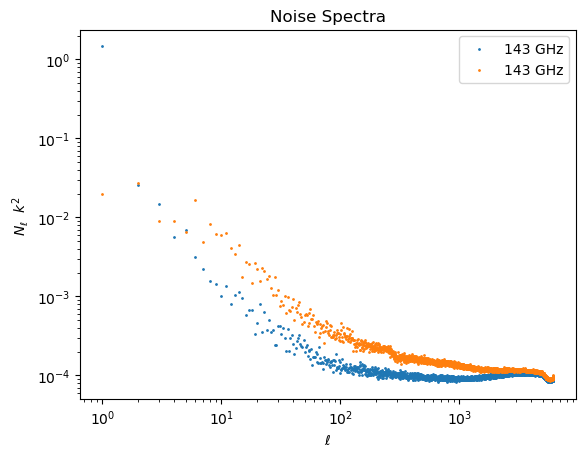

In [52]:
#plot sim noise and diff noise
ell = np.arange(len(planck_noise_spectra[f'{frequencys[0]}']))
plt.figure(figsize=(10, 10))
for frequency in frequencys:
    plt.scatter(ell, planck_noise_spectra[f'{frequency}'], label=f'{frequency} GHz', s = 1)
    plt.scatter(ell, noise_map_diff_ps[f'{frequency}'], label=f'{frequency} GHz', s = 1)
    plt.legend()
    plt.yscale('log')
    plt.xscale('log')
    plt.xlabel('$\ell$')
    plt.ylabel('$N_{\ell}$  $k^2$ ')
    plt.title('Noise Spectra')
    plt.show()

In [54]:
#Fitting to sim noise
ell = np.arange(len(planck_noise_spectra[f'{frequencys[0]}']))
for frequency in frequencys:
    popt, pcov = curve_fit(Noise_model, ell, planck_noise_spectra[f'{frequency}'], maxfev=1000000)
    print(popt)
    plt.figure(figsize=(10, 10))
    plt.scatter(ell, planck_noise_spectra[f'{frequency}'], label=f'{frequency} GHz', s = 1)
    plt.plot(ell, Noise_model(ell, *popt), label=f'Fit {frequency} GHz')
    plt.legend()
    plt.yscale('log')
    plt.xscale('log')
    plt.xlabel('$\ell$')
    plt.ylabel('$N_{\ell}$  $k^2$ ')
    plt.title('Noise Spectra')
    plt.show()

/tmp/ipykernel_72026/2943852647.py:2: RuntimeWarning: divide by zero encountered in divide
  return sigma**2*(1+(ell_knee/ell)**alpha)


RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 1000000.

In [6]:
reso = hp.pixelfunc.nside2resol(1024, arcmin=True)
width = 128* reso/60
print(reso,width)

3.435486411817406 7.329037678543799


In [39]:
reso = hp.pixelfunc.nside2resol(512, arcmin=True)
print(reso/60)

0.11451621372724687


In [37]:
sigma_pix = (4*np.pi/(12*512**2))*57.2957795**2
reso_pix = np.sqrt(sigma_pix) #resolution in degree
print(reso_pix)

0.1145162137010994


In [36]:
noise_mean = {}
noise_variance = {}
noise_mean[f'{frequency}'] = np.mean(noise_map[f'{frequency}'])
noise_variance[f'{frequency}'] = np.var(noise_map[f'{frequency}'])

NameError: name 'noise_map' is not defined

In [29]:
noise_mean[f'{frequency}'], noise_variance[f'{frequency}']

(-5.389791087960441e-09, 1.2463772300488285e-10)

In [30]:
np.mean(noise_map_decon[f'{frequency}']), np.var(noise_map_decon[f'{frequency}'])

(-5.390878083249402e-09, 2.6666542199987903e-11)

In [19]:
np.mean(planck_noise_map[f'{frequency}']), np.var(planck_noise_map[f'{frequency}'])

(1.4828402e-07, 2.118522e-09)

In [14]:
std_path = { '30' : '/shared/data/Assets/Planck/LFI_SkyMap_030-BPassCorrected_1024_R3.00_full.fits',
             '100': '/shared/data/Assets/Planck/HFI_SkyMap_100_2048_R3.01_full.fits',
             '143': '/shared/data/Assets/Planck/HFI_SkyMap_143_2048_R3.01_full.fits'
             }

std_ps_list = {}

for frequency in frequencys:
    fits.open(std_path[f'{frequency}'])[1].header
    ii_cov = fits.open(std_path[f'{frequency}'])[1].data['II_COV']
    sigma_i = np.sqrt(ii_cov)
    ii_covmap = hp.read_map(std_path[f'{frequency}'], hdu = 1, field = 4)
    std_map = np.sqrt(ii_covmap)
    std_map_512_temp = alm_udgrade(std_map, 512)
    rng = np.random.default_rng(1)
    noise_map = rng.normal(scale = std_map)
    std_ps_list[f'{frequency}'] = hp.anafast(noise_map)

In [41]:
np.mean(sigma_i), np.var(sigma_i)

(4.3825858e-05, 7.472415e-11)

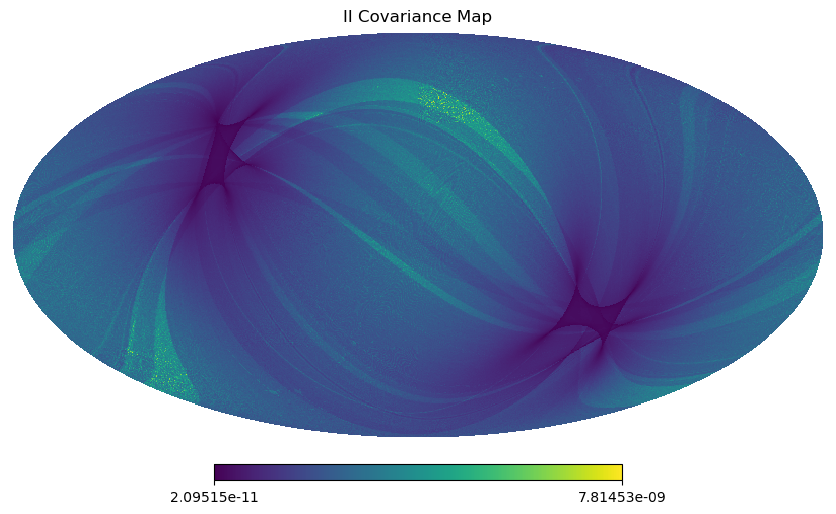

In [14]:
ii_covmap = hp.read_map(std_path[f'{frequency}'], hdu = 1, field = 4)
hp.mollview(ii_covmap, title='II Covariance Map')

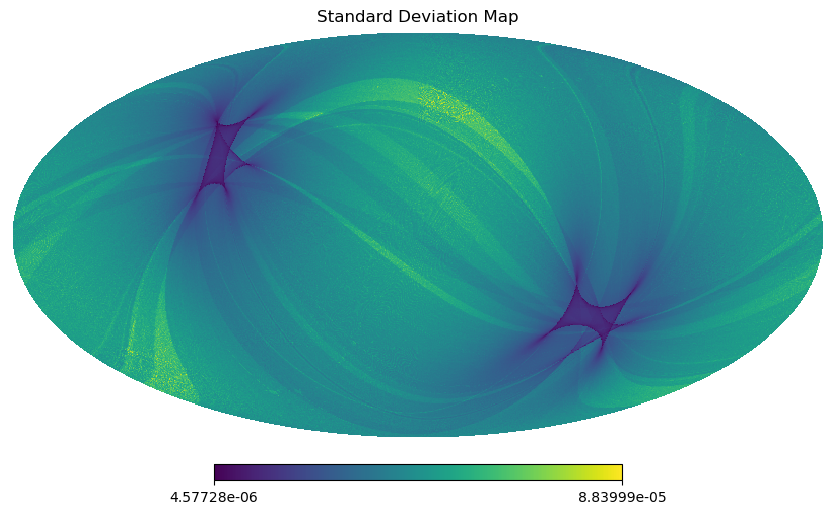

In [15]:
std_map = np.sqrt(ii_covmap)
hp.mollview(std_map, title='Standard Deviation Map')

In [47]:
np.mean(noise_map), np.var(noise_map)

(4.893801131439073e-09, 1.995449133220257e-09)

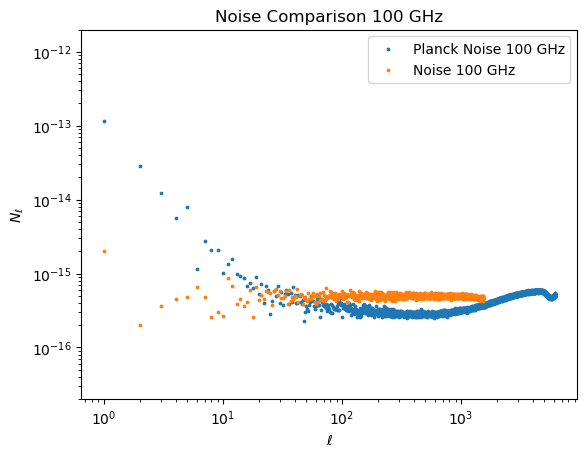

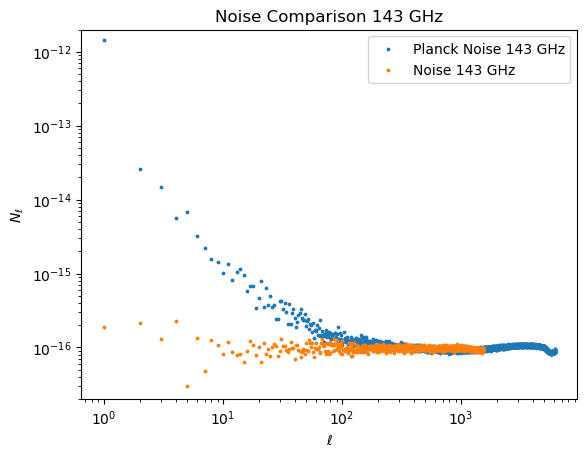

In [11]:
dot_size = 3

# ells_1 = np.arange(len(std_ps_list[f'{frequency}']))
ells_2 = np.arange(len(planck_noise_spectra[f'{frequency}']))
ells_3 = np.arange(len(noise_spectra[f'{frequency}']))

for i, frequency in enumerate(frequencys):
    # plt.scatter(ells_1, std_ps_list[f'{frequency}'], s = dot_size, label='Standard Deviation Map')
    plt.scatter(ells_2, planck_noise_spectra[f'{frequency}'], s = dot_size,label=f'Planck Noise {frequency} GHz')
    plt.scatter(ells_3, noise_spectra[f'{frequency}'], s = dot_size, label=f'Noise {frequency} GHz')
    plt.xscale('log')
    plt.yscale('log')
    # plt.xlim(0, 1535)
    plt.ylim(2e-17, 2e-12)
    plt.xlabel('$\ell$')
    plt.ylabel('$N_{\ell}$')
    plt.title(f'Noise Comparison {frequency} GHz')
    plt.legend()
    plt.show()
# plt.scatter(ells_1, std_ps, s = dot_size, label='Standard Deviation Map')
# plt.scatter(ells_2, planck_noise_spectra[f'{frequency}'], s = dot_size,label=f'Planck Noise {frequency} GHz')
# plt.scatter(ells_3, noise_spectra[f'{frequency}'], s = dot_size, label=f'Noise {frequency} GHz')
# plt.xscale('log')
# plt.yscale('log')
# plt.xlim(0, 1535)
# plt.ylim(2e-16, 2e-14)
# plt.legend()
# plt.show()

In [20]:
ps =  planck_noise_spectra[f'{frequency}'][2:]

In [7]:
def noise_model (ell, ell_c, alpha, beta, gamma, delta, A, B):
    n_ell = A*(100/ell)**alpha + B*((ell/1000)**beta)/(1 + (ell/ ell_c)**gamma)**delta
    return n_ell

popt_list = {}
pcov_list = {}
for frequency in frequencys:
    ps =  planck_noise_spectra[f'{frequency}'][2:]
    ells = np.arange(len(planck_noise_spectra[f'{frequency}']))
    popt, pcov = curve_fit(noise_model, ells[2:], ps, maxfev = 500000)
    popt_list[f'{frequency}'] = popt
    pcov_list[f'{frequency}'] = pcov


/tmp/ipykernel_41696/244323434.py:2: RuntimeWarning: invalid value encountered in power
  n_ell = A*(100/ell)**alpha + B*((ell/1000)**beta)/(1 + (ell/ ell_c)**gamma)**delta


In [8]:
popt_list

{'100': array([9.21526879e+01, 1.85794293e+00, 2.34682283e-01, 1.47763124e-06,
        1.95499578e+01, 1.93578004e-17, 2.85518495e-10]),
 '143': array([1.38260136e+01, 1.77422483e+00, 9.42788557e+00, 3.21724781e+01,
        2.93346616e-01, 2.53080481e-17, 3.51471283e+01])}

In [11]:
std_list = {}
for frequency in frequencys:
    std_list[f'{frequency}'] = np.sqrt(np.diag(pcov_list[f'{frequency}']))
print(std_list)

{'100': array([1.51618826e+06, 7.21820428e-03, 3.85914342e-01, 2.22787796e-02,
       4.34930749e+05, 5.24171958e-19, 8.60757623e-05]), '143': array([3.91709402e+00, 4.85001274e-03, 2.19774652e+01, 1.58229449e+02,
       1.98356361e+00, 4.60358691e-19, 3.39339389e+03])}


In [71]:
def noise_model (ell, ell_c, alpha, beta, gamma, delta, A, B):
    n_ell = A*(100/ell)**alpha + B*((ell/1000)**beta)/(1 + (ell/ ell_c)**gamma)**delta
    return n_ell

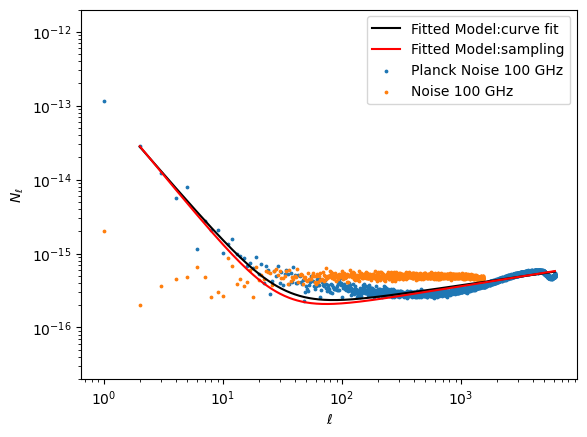

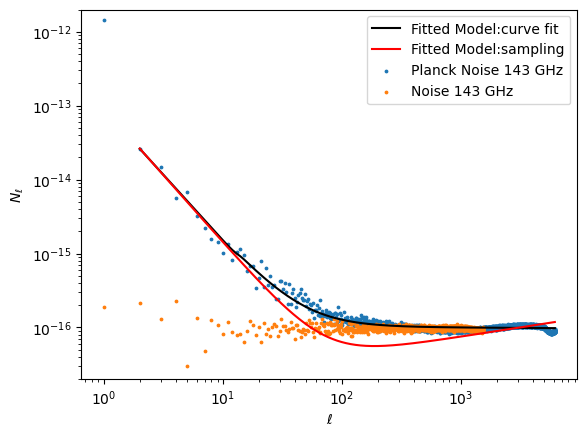

In [14]:
# sampling_params = [8.22152619e+01, 1.96420916e+00, 2.28075032e-01, 2.02649462e-06,1.93327199e+01, 1.29960375e-17, 2.47634782e-10]
sampling_params = {'100': np.array([8.19027632e+01, 1.95329944e+00, 2.60446328e-01, 1.94521989e-06, 1.93378469e+01, 1.35592287e-17, 2.39224640e-10]),
                   '143': np.array([8.27751230e+01, 1.82001463e+00, 2.51516689e-01, 2.08062462e-06, 2.16254150e+01, 2.12853028e-17, 2.42709679e-10])}
dot_size = 3

# ells_1 = np.arange(len(std_ps))
ells_2 = np.arange(len(planck_noise_spectra[f'{frequency}']))
ells_3 = np.arange(len(noise_spectra[f'{frequency}']))

for frequency in frequencys:
    # plt.scatter(ells_1, std_ps, s = dot_size, label='Standard Deviation Map')
    plt.plot(ells_2[2:], noise_model(ells_2[2:], *popt_list[f'{frequency}']), label='Fitted Model:curve fit', c = 'black' )
    plt.plot(ells_2[2:], noise_model(ells_2[2:],  *sampling_params[f'{frequency}']), label='Fitted Model:sampling', c = 'red' )
    plt.scatter(ells_2, planck_noise_spectra[f'{frequency}'], s = dot_size,label=f'Planck Noise {frequency} GHz')
    plt.scatter(ells_3, noise_spectra[f'{frequency}'], s = dot_size, label=f'Noise {frequency} GHz')
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('$\ell$')
    plt.ylabel('$N_{\ell}$')
    #plt.xlim(0, 1535)
    plt.ylim(2e-17, 2e-12)
    plt.legend()
    plt.show()

In [20]:
noise_spectrum = 1/(1/planck_noise_spectra['100'] + 1/planck_noise_spectra['143'])
fitted_noise = 1/ (1/noise_model(ells_2[2:], *popt_list['100']) + 1/noise_model(ells_2[2:], *popt_list['143']))
sim_noise = 1/(1/noise_spectra['100'] + 1/noise_spectra['143'])

/tmp/ipykernel_6515/193908627.py:8: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim(0, 1535)


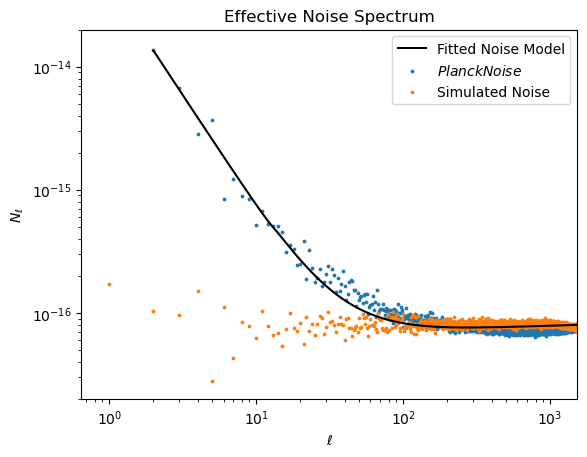

In [21]:
plt.plot(ells_2[2:],fitted_noise, c = 'black', label='Fitted Noise Model')
plt.scatter(ells_2,noise_spectrum, s = dot_size, label='$Planck Noise$')
plt.scatter(ells_3,sim_noise, s = dot_size, label='Simulated Noise')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('$\ell$')
plt.ylabel('$N_{\ell}$')
plt.xlim(0, 1535)
plt.ylim(2e-17, 2e-14)
plt.title('Effective Noise Spectrum')
plt.legend()
plt.show()

In [5]:
cmb_path = '/home/yunan/pyilc/output/IQU_512_1450_test/512_mask/0/CN_needletILCmap_component_CMB.fits'
cmb_map = hp.read_map(cmb_path)
convolutional_beam = hp.gauss_beam(5*np.pi/(180*60), 1534)
cmb_alm_decon = hp.almxfl(hp.map2alm(cmb_map), 1/convolutional_beam)
mask_path = '/home/yunan/planck_release/planck_mask_512.fits'
mask = hp.read_map(mask_path)
fsky = np.sum(mask)/mask.size
deconv_map = hp.alm2map(cmb_alm_decon, nside=512)
cl = get_power(deconv_map, deconv_map, mask, lmax=1534)
#cl_total = cl[2:1534] + noise_spectrum[2:1534]
ell = np.arange(len(cl))


In [13]:
obs_map_path = {'44': '/shared/data/Datasets/IQU_512_1450/Simulation/Test/sim0000/obs_44_map.fits',
                '70': '/shared/data/Datasets/IQU_512_1450/Simulation/Test/sim0000/obs_70_map.fits',
                '100': '/shared/data/Datasets/IQU_512_1450/Simulation/Test/sim0000/obs_100_map.fits',
                '143': '/shared/data/Datasets/IQU_512_1450/Simulation/Test/sim0000/obs_143_map.fits',
                '217': '/shared/data/Datasets/IQU_512_1450/Simulation/Test/sim0000/obs_217_map.fits',
                '353': '/shared/data/Datasets/IQU_512_1450/Simulation/Test/sim0000/obs_353_map.fits',
                '545': '/shared/data/Datasets/IQU_512_1450/Simulation/Test/sim0000/obs_545_map.fits',
                '857': '/shared/data/Datasets/IQU_512_1450/Simulation/Test/sim0000/obs_857_map.fits'}
obs_map = {}
freqs = ['44', '70', '100', '143', '217', '353', '545', '857']
for freq in freqs:
    obs_map[freq] = hp.read_map(obs_map_path[freq])*10**3


<Figure size 640x480 with 0 Axes>

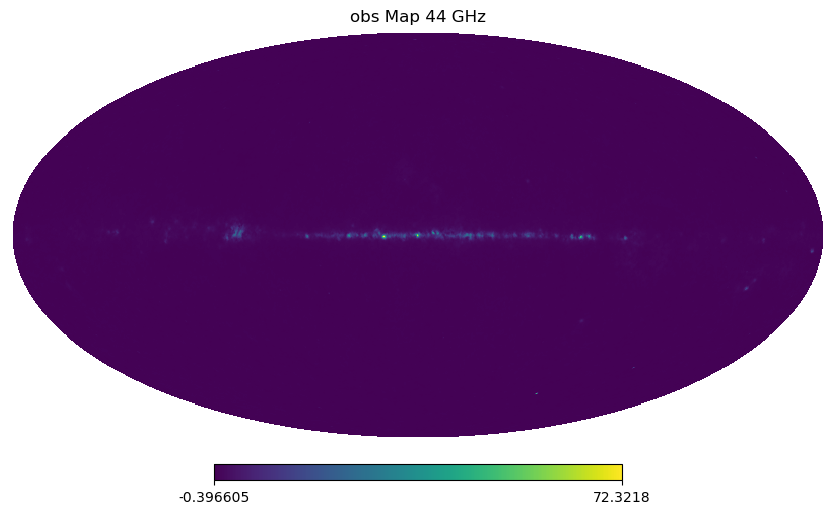

<Figure size 640x480 with 0 Axes>

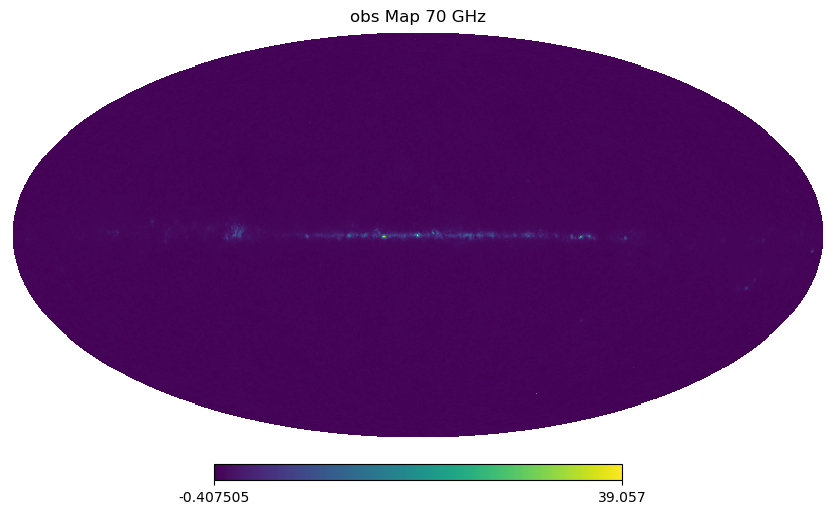

<Figure size 640x480 with 0 Axes>

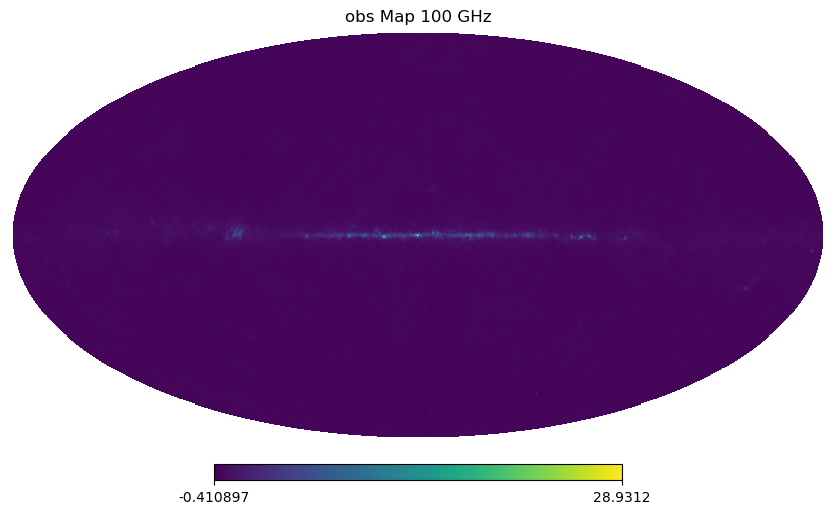

<Figure size 640x480 with 0 Axes>

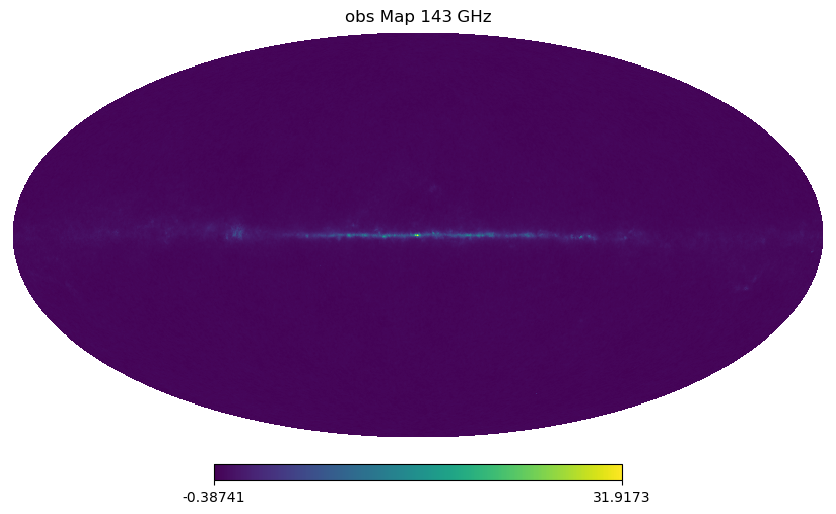

<Figure size 640x480 with 0 Axes>

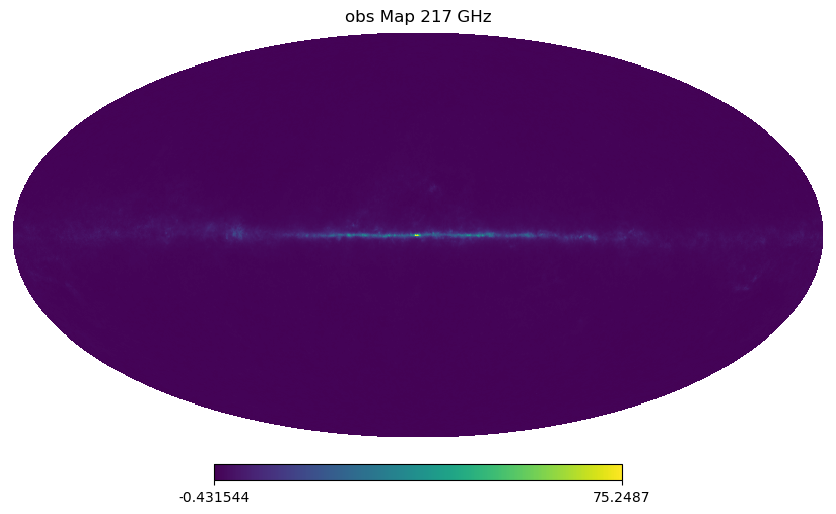

<Figure size 640x480 with 0 Axes>

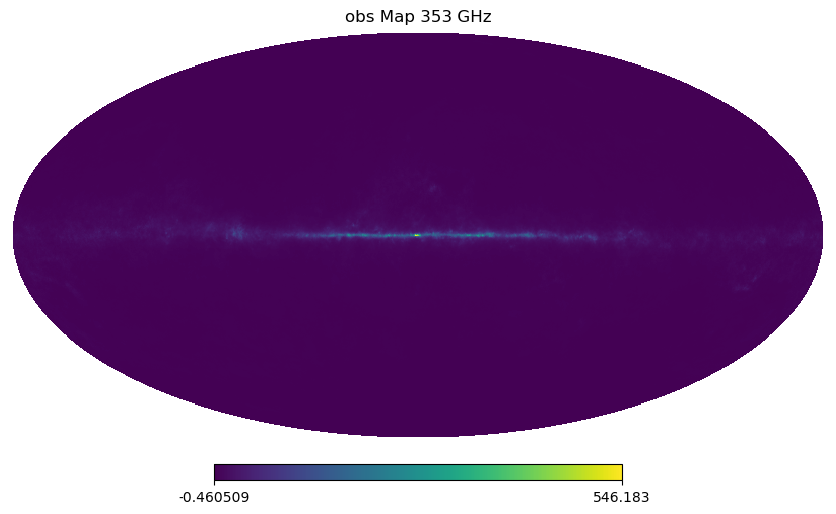

<Figure size 640x480 with 0 Axes>

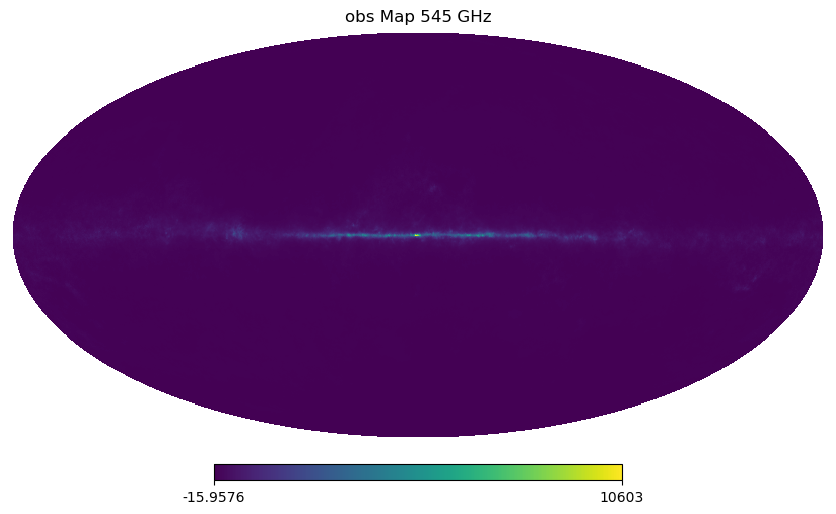

<Figure size 640x480 with 0 Axes>

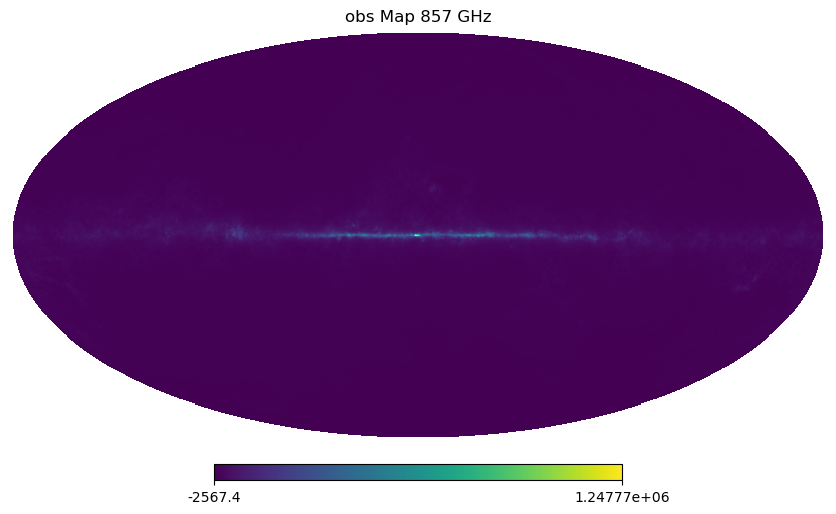

In [14]:
for freq in freqs:
    plt.figure()
    hp.mollview(obs_map[freq], title=f'obs Map {freq} GHz')
    plt.show()

In [10]:
residual = {}
fwhm = {'44': 27.94348615,
        '70': 13.299313,
        '100': 9.665,
        '143': 7.303,
        '217': 5.021,
        '353': 4.944,
        '545': 4.831,
        '857': 4.638}
for freq in freqs:
    residual[freq] = obs_map[freq] - hp.smoothing(deconv_map, fwhm[freq]*np.pi/(180*60))

<Figure size 640x480 with 0 Axes>

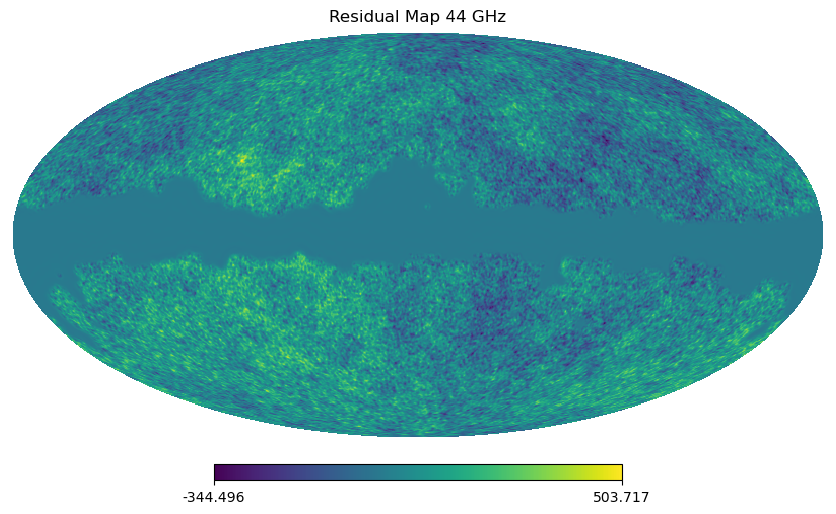

<Figure size 640x480 with 0 Axes>

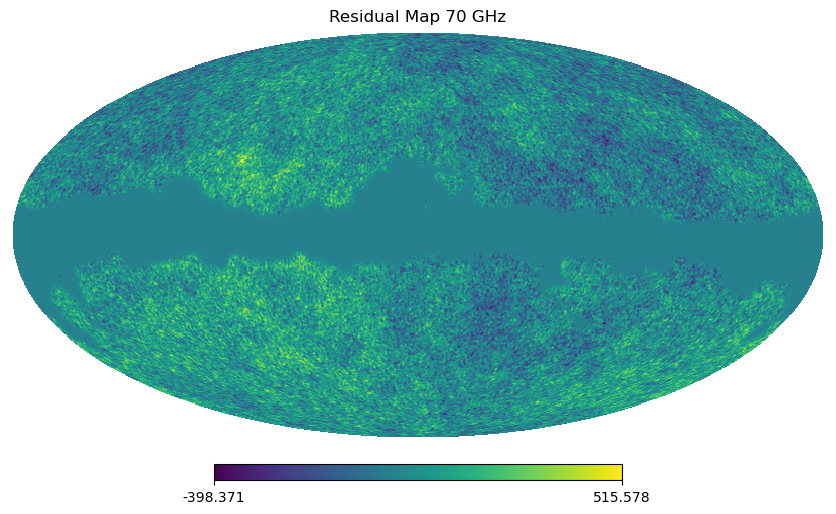

<Figure size 640x480 with 0 Axes>

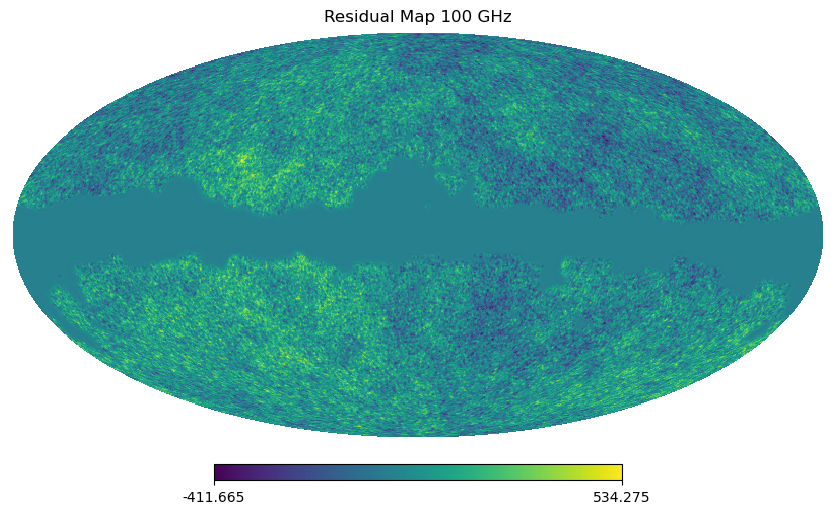

<Figure size 640x480 with 0 Axes>

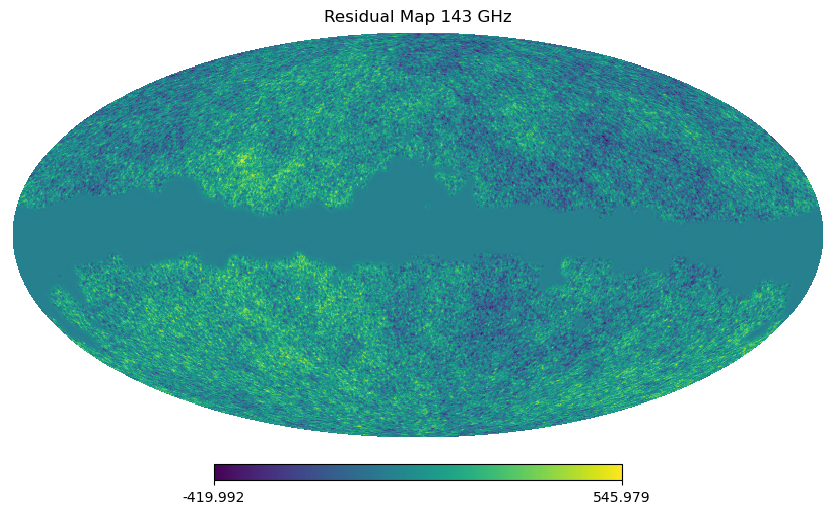

<Figure size 640x480 with 0 Axes>

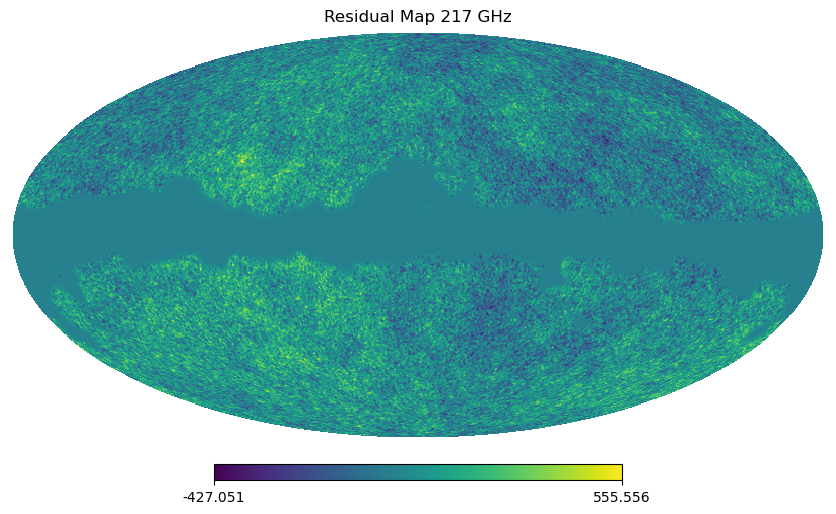

<Figure size 640x480 with 0 Axes>

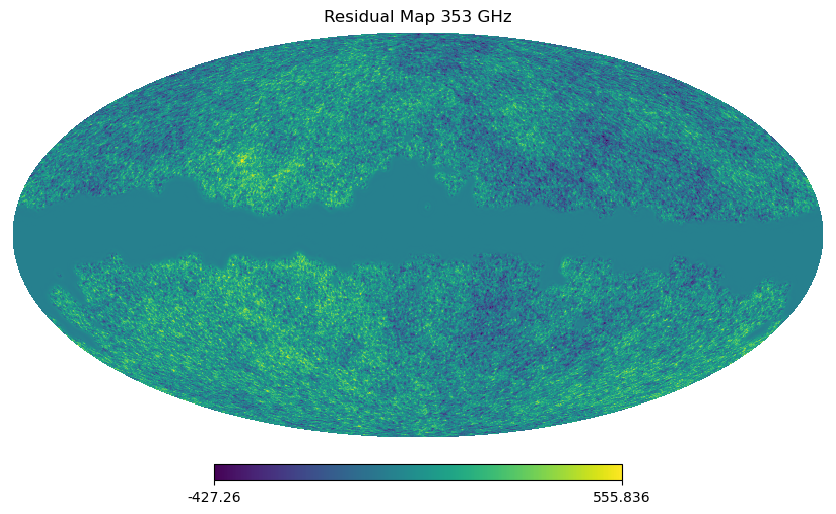

<Figure size 640x480 with 0 Axes>

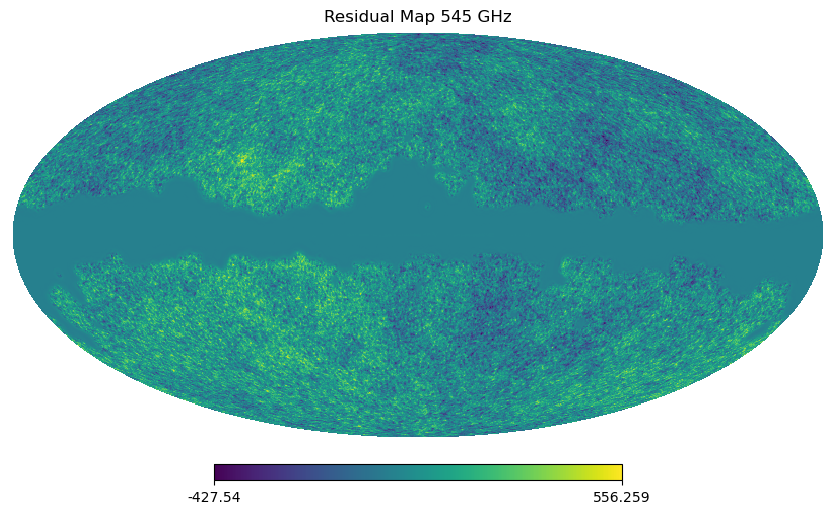

<Figure size 640x480 with 0 Axes>

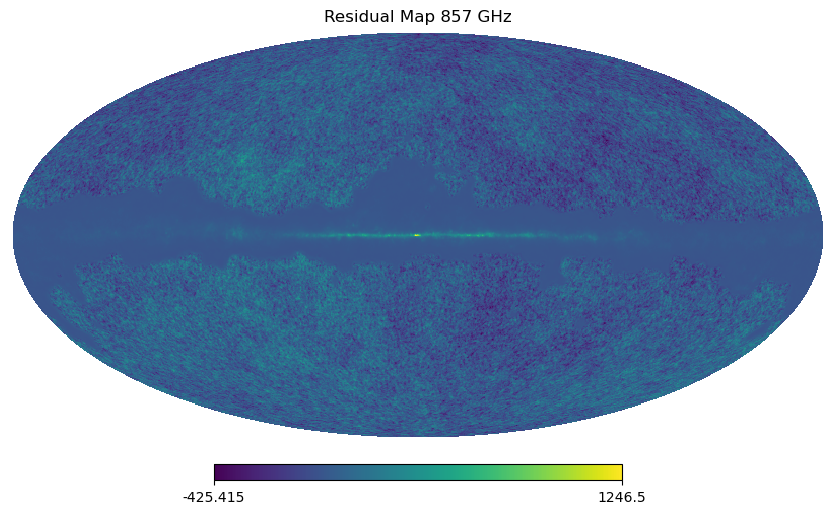

In [11]:
for freq in freqs:
    plt.figure()
    hp.mollview(residual[freq], title=f'Residual Map {freq} GHz')
    plt.show()

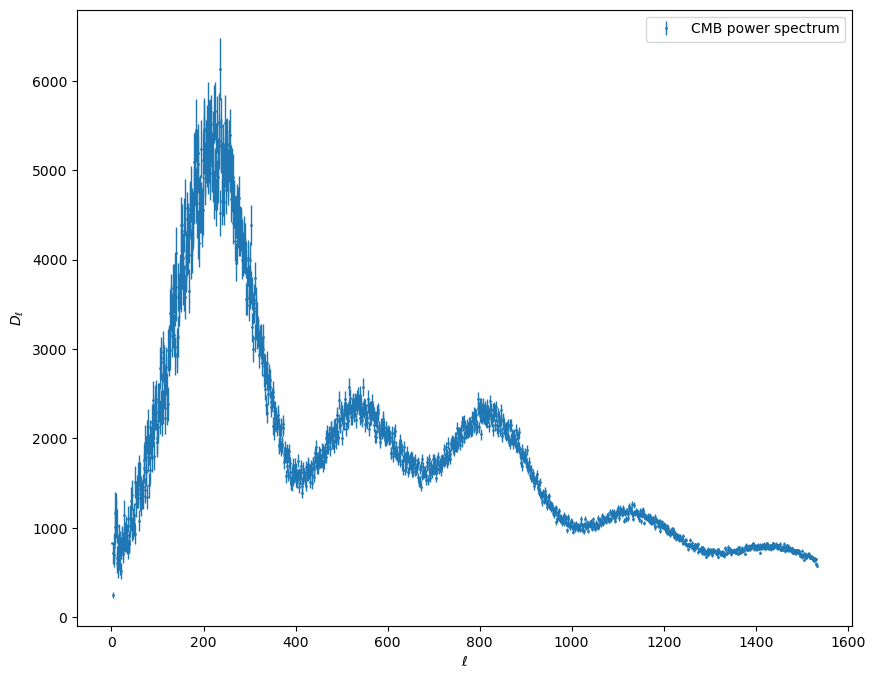

In [23]:
sigma_ell = variance(cl_total, fsky)
dl = cl2dl(cl)
plt.figure(figsize=(10, 8))  # Set the figure size to 10x8 inches
plt.errorbar(ell[2:1534], dl[2:1534], yerr= cl2dl(sigma_ell), fmt='o', markersize = 1, elinewidth = 1 ,label='CMB power spectrum')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$D_\ell$')
plt.legend()
plt.show()

In [24]:
ell, planck_dl, delta_minus_dl, delta_plus_dl = np.genfromtxt('/home/yunan/COM_PowerSpect_CMB-TT-full_R3.01.txt', unpack=True)
planck_cv = variance(planck_dl, 1)
indxs = np.where(planck_cv < 0)

ell = np.delete(ell, indxs)
planck_dl = np.delete(planck_dl, indxs)
planck_cv = np.delete(planck_cv, indxs)
delta_minus_dl = np.delete(delta_minus_dl, indxs)
delta_plus_dl  = np.delete(delta_plus_dl, indxs)
asymmetric_error = [delta_minus_dl, delta_plus_dl]

In [25]:
planck_cl_total = dl2cl(planck_dl[2:1534]) + noise_spectrum[2:1534]
sigma_ell_planck = variance(planck_cl_total, fsky)

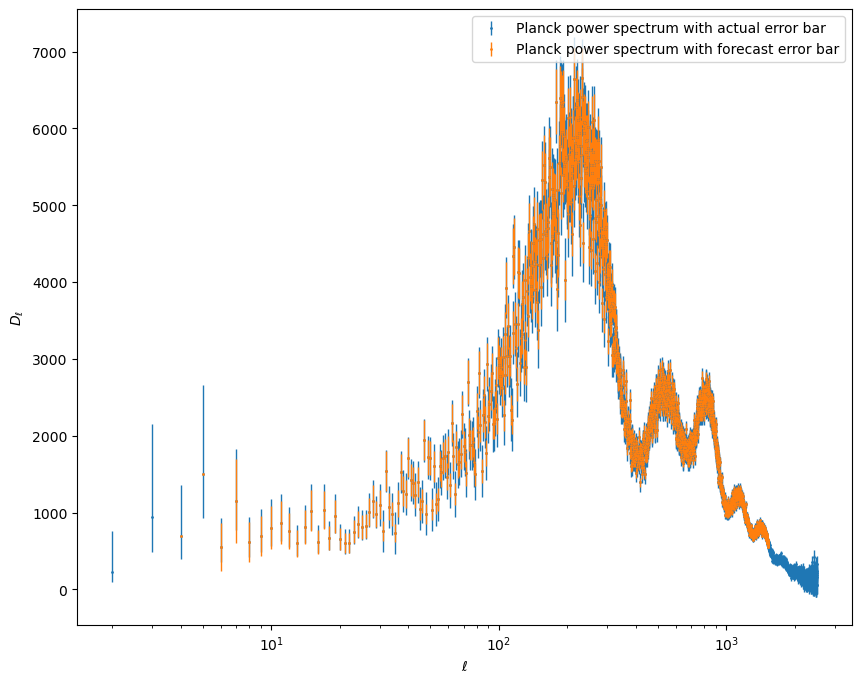

In [26]:
plt.figure(figsize=(10, 8))

# Plot the data with error bars
plt.errorbar(ell, planck_dl, yerr=asymmetric_error, fmt='o', markersize=1, elinewidth=1, label='Planck power spectrum with actual error bar')
plt.errorbar(ell[2:1534], planck_dl[2:1534], yerr=cl2dl(sigma_ell_planck), fmt='o', markersize=1, elinewidth=1, label='Planck power spectrum with forecast error bar')

# Add labels and legend
plt.xscale('log')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$D_\ell$')
plt.legend()

# Show the plot
plt.show()

Text(0.5, 1.0, 'Planck NILC CMB power spectrum with actual and forecast error bar')

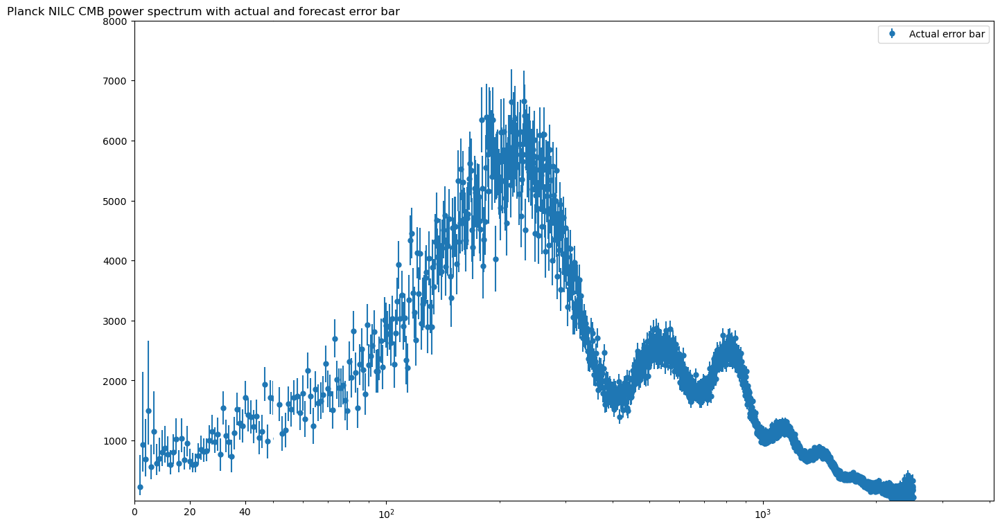

In [29]:
scale_pivot = 50
dot_size = 5
error_size = 1.5

asymmetric_error_1 = [delta_minus_dl[:scale_pivot], delta_plus_dl[:scale_pivot]]
asymmetric_error_2 = [delta_minus_dl[scale_pivot:], delta_plus_dl[scale_pivot:]]

plt.figure(figsize=(16, 9)) 

axMain = plt.subplot(111)
axMain.errorbar(ell[scale_pivot:], planck_dl[scale_pivot:], yerr=asymmetric_error_2, fmt='o', markersize = dot_size, elinewidth = error_size ,label='Actual error bar')
#axMain.errorbar(ell[scale_pivot:1534], planck_dl[scale_pivot:1534], yerr=cl2dl(sigma_ell_planck)[scale_pivot-2:], fmt='o', markersize = dot_size, elinewidth = error_size, label='Forecast error bar')
axMain.set_xscale('log')
axMain.set_xlim((scale_pivot, 4097))
axMain.set_ylim(1e-3, 8e3)
axMain.spines['left'].set_visible(False)
axMain.yaxis.set_ticks_position('right')
axMain.yaxis.set_visible(False)
plt.legend()


divider = make_axes_locatable(axMain)
axLin = divider.append_axes("left", size=2.0, pad=0, sharey=axMain)
axLin.set_xscale('linear')
axLin.set_xlim((0, scale_pivot))
axLin.set_ylim(1e-3, 8e3)
axLin.errorbar(ell[:scale_pivot], planck_dl[:scale_pivot], yerr=asymmetric_error_1, fmt='o', markersize = dot_size, elinewidth = error_size, label='Actual error bar')
#axLin.errorbar(ell[2:scale_pivot], planck_dl[2:scale_pivot], yerr=cl2dl(sigma_ell_planck)[:scale_pivot-2], fmt='o', markersize = dot_size, elinewidth = error_size, label='Forecast error bar')
axLin.spines['right'].set_visible(False)
axLin.yaxis.set_ticks_position('left')
plt.setp(axLin.get_xticklabels(), visible=True)
plt.title('Planck NILC CMB power spectrum with actual and forecast error bar') 

In [82]:
def noise_model (ell, params):
    ell_c, alpha, beta, gamma, delta, A, B = params
    n_ell = A*(100/ell)**alpha + B*((ell/1000)**beta)/(1 + (ell/ ell_c)**gamma)**delta
    return n_ell

def likelihood_func(data_x, data_y, noise_params):
    model_y = noise_model(data_x, noise_params)   
    loglike = (data_y - model_y)**2
    loglike = -np.sum(loglike)
    return loglike

def mcmc_sampler(likelihood, initial_params, x, y, steps=1000, step_size=0.1):
    params = np.array(initial_params)
    samples = [params]
    for _ in range(steps):
        new_params = params + np.random.normal(0, step_size, len(params))
        if likelihood(x, y, new_params) > likelihood(x, y, params):
            params = new_params
        samples.append(params)
    return np.array(samples)

ps =  planck_noise_spectra['100'][2:]
initial_params = [9.21526879e+01, 1.85794293e+00, 2.34682283e-01, 1.47763124e-06, 1.95499578e+01, 1.93578004e-17, 2.85518495e-10]
samples = mcmc_sampler(likelihood_func, initial_params,ells_2[2:], ps, steps=10000, step_size=0.1)

In [97]:
step_vec = [1, 0.1, 1e-2, 1e-7, 1, 1e-18, 1e-11]
np.random.randn(len(initial_params))*step_vec

array([-1.19065489e+00, -4.66943477e-02, -6.09389166e-04, -1.33682379e-07,
        2.34116615e-01, -1.21768208e-18, -1.37127576e-11])

In [103]:
pcov_list['100']

array([[ 2.29882685e+12,  3.51842340e+01, -1.58083100e+05,
        -1.52319304e+04, -1.24760076e+10, -3.79224006e-15,
        -2.46929128e+00],
       [ 3.51842340e+01,  5.21024730e-05, -2.00775023e-04,
         7.41747632e-07, -2.76758793e+02, -3.76785533e-21,
        -5.47724489e-08],
       [-1.58083100e+05, -2.00775023e-04,  1.48929879e-01,
         4.75929866e-03,  1.38557716e+05,  1.11809528e-20,
         2.74215562e-05],
       [-1.52319304e+04,  7.41747632e-07,  4.75929866e-03,
         4.96344020e-04, -1.25986409e+02, -2.24759448e-23,
        -2.49295856e-08],
       [-1.24760076e+10, -2.76758793e+02,  1.38557716e+05,
        -1.25986409e+02,  1.89164756e+11,  1.50707176e-14,
         3.74369957e+01],
       [-3.79224006e-15, -3.76785533e-21,  1.11809528e-20,
        -2.24759448e-23,  1.50707176e-14,  2.74756242e-37,
         2.98259777e-24],
       [-2.46929128e+00, -5.47724489e-08,  2.74215562e-05,
        -2.49295856e-08,  3.74369957e+01,  2.98259777e-24,
         7.4090368

In [30]:
def noise_model(ell, params):
    ell_c, alpha, beta, gamma, delta, A, B = params
    n_ell = A*(100/ell)**alpha + B*((ell/1000)**beta)/(1 + (ell/ ell_c)**gamma)**delta
    return n_ell

def likelihood_func(data_x, data_y, noise_params):
    model_y = noise_model(data_x, noise_params)   
    loglike = (data_y - model_y)**2
    loglike = -np.sum(loglike)
    return loglike

def mcmc_sampler(likelihood, initial_params, x, y, steps=10000, step_vec = [0.1]):
    params = np.array(initial_params)
    samples = [params]
    for _ in range(steps):
        new_params = params + np.random.randn(len(params))*step_vec
        if likelihood(x, y, new_params) > likelihood(x, y, params):
            params = new_params
        samples.append(params)
    return np.array(samples)

# Example usage:
ps = planck_noise_spectra['100'][2:]
#initial_params = [9.21526879e+01, 1.85794293e+00, 2.34682283e-01, 1.47763124e-06, 1.95499578e+01, 1.93578004e-17, 2.85518495e-10]
initial_params = [8.21526879e+01, 1.45794293e+00, 2.94682283e-01, 1.97763124e-06, 1.15499578e+01, 1.23578004e-17, 2.55518495e-10]
steps = 500000
step_vec = [1e-2, 1e-3, 1e-4, 1e-9, 1e-2, 1e-20, 1e-13] # Fraction of the initial parameter values used as step size

samples = mcmc_sampler(likelihood_func, initial_params, ells_2[2:], ps, steps=steps, step_vec=step_vec)

# Print some of the sampled parameters
print(samples)

[[8.21526879e+01 1.45794293e+00 2.94682283e-01 ... 1.15499578e+01
  1.23578004e-17 2.55518495e-10]
 [8.21526879e+01 1.45794293e+00 2.94682283e-01 ... 1.15499578e+01
  1.23578004e-17 2.55518495e-10]
 [8.21526879e+01 1.45794293e+00 2.94682283e-01 ... 1.15499578e+01
  1.23578004e-17 2.55518495e-10]
 ...
 [8.22152619e+01 1.96420916e+00 2.28075032e-01 ... 1.93327199e+01
  1.29960375e-17 2.47634782e-10]
 [8.22152619e+01 1.96420916e+00 2.28075032e-01 ... 1.93327199e+01
  1.29960375e-17 2.47634782e-10]
 [8.22152619e+01 1.96420916e+00 2.28075032e-01 ... 1.93327199e+01
  1.29960375e-17 2.47634782e-10]]


In [34]:
print(samples[-3:-1])

[[8.22152619e+01 1.96420916e+00 2.28075032e-01 2.02649462e-06
  1.93327199e+01 1.29960375e-17 2.47634782e-10]
 [8.22152619e+01 1.96420916e+00 2.28075032e-01 2.02649462e-06
  1.93327199e+01 1.29960375e-17 2.47634782e-10]]


In [75]:
def noise_model(ell, params):
    ell_c, alpha, beta, gamma, delta, A, B = params
    n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
    return n_ell

def likelihood_func(data_x, data_y, noise_params):
    model_y = noise_model(data_x, noise_params)   
    loglike = (data_y - model_y) ** 2
    loglike = -np.sum(loglike)
    return loglike

def mcmc_sampler(likelihood, initial_params, x, y, steps=10000, step_vec=[0.1], convergence_threshold=1e-6, convergence_steps=1000, check_interval=100):
    params = np.array(initial_params)
    samples = [params]
    likelihoods = [likelihood(x, y, params)]
    stable_count = 0

    for step in range(steps):
        new_params = params + np.random.randn(len(params)) * step_vec
        new_likelihood = likelihood(x, y, new_params)
        
        if new_likelihood > likelihood(x, y, params):
            params = new_params
            likelihoods.append(new_likelihood)
        else:
            likelihoods.append(likelihood(x, y, params))
        samples.append(params)
        
        if step > 0 and step % check_interval == 0:
            recent_likelihoods = likelihoods[-check_interval:]
            change = np.mean(np.abs(np.diff(recent_likelihoods)))
            if change < convergence_threshold:
                stable_count += 1
            else:
                stable_count = 0

            if stable_count >= convergence_steps:
                print(f"Convergence reached after {step} steps.")
                break

    return np.array(samples)

initial_params = { '100' :  np.array([8.21526879e+01, 1.45794293e+00, 2.94682283e-01, 1.97763124e-06, 1.15499578e+01, 1.23578004e-17, 2.55518495e-10]),
                   '143' :  np.array([1.38260136e+01, 1.77422483e+00, 9.42788557e+00, 3.21724781e+01, 2.93346616e-01, 2.53080481e-17, 3.51471283e+01])
                 }
steps = 500000
step_vec = [1e-2, 1e-3, 1e-4, 1e-9, 1e-2, 1e-20, 1e-13]

for frequency in frequencys:
    ps = planck_noise_spectra[f'{frequency}'][2:]
    samples = mcmc_sampler(likelihood_func, initial_params[f'{frequency}'], ells_2[2:], ps, steps=steps, step_vec=step_vec)
    # Print some of the sampled parameters
    print(samples[-1])

Convergence reached after 100000 steps.
[8.21118693e+01 1.96396053e+00 2.28054214e-01 1.96813510e-06
 1.93302196e+01 1.30078856e-17 2.47210008e-10]
Convergence reached after 100000 steps.
[1.38260136e+01 1.77422483e+00 9.42788557e+00 3.21724781e+01
 2.93346616e-01 2.53080481e-17 3.51471283e+01]


In [79]:
samples[0] - samples[-1]

array([0., 0., 0., 0., 0., 0., 0.])

In [10]:
planck_noise_spectra['100'][2:].size

6142

In [11]:
print(np.linspace(2, 6144, 6142).size)

6142


Best parameters: (95.0, 2.0, 0.5, 1e-07, 10.0, 1e-16, 0.01)
Best MSE: 136694.47495823493


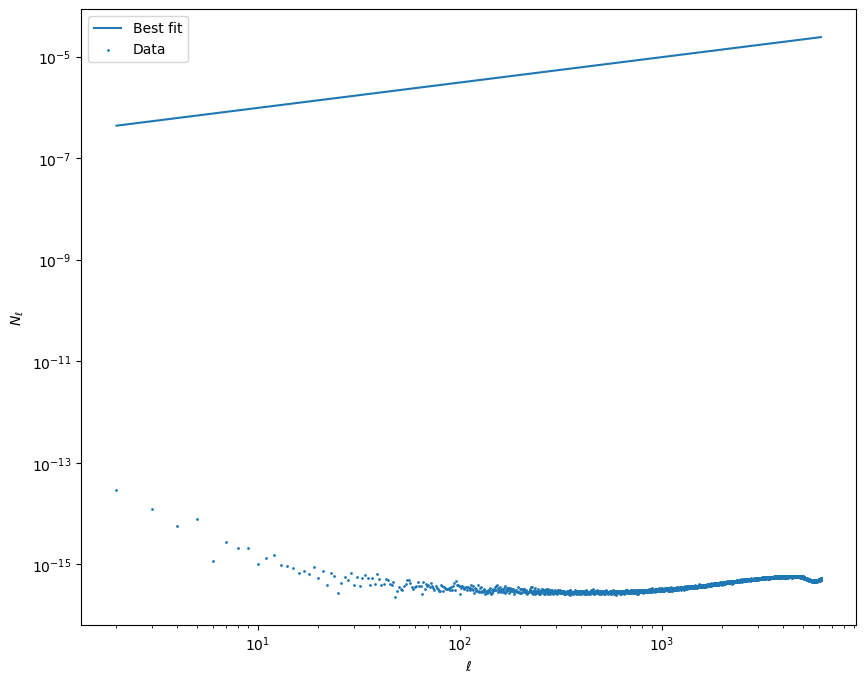

In [11]:
# Define the noise model function
def noise_model(ell, params):
    ell_c, alpha, beta, gamma, delta, A, B = params
    n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
    return n_ell

# Define the objective function (e.g., mean squared error)
def objective_function(params, ell, data_y):
    model_y = noise_model(ell, params)
    mse = -np.sum(np.log((data_y - model_y) ** 2))
    return mse

steps = 10

# Define the parameter ranges for the grid search
param_ranges = {
    'ell_c': np.linspace(80, 95, steps),
    'alpha': np.linspace(1, 2, steps),
    'beta': np.linspace(0.1, 0.5, steps),
    'gamma': np.linspace(1e-7, 1e-5, steps),
    'delta': np.linspace(10, 20, steps),
    'A': np.linspace(1e-18, 1e-16, steps),
    'B': np.linspace(1e-4, 1e-2, steps)
}

# Generate all combinations of parameters
param_combinations = list(itertools.product(*param_ranges.values()))

# Example data (replace with actual data)
ell = np.linspace(2, 6144, 6142)
data_y = planck_noise_spectra['100'][2:]

# Perform grid search
best_params = None
best_mse = float('inf')

for params in param_combinations:
    mse = objective_function(params, ell, data_y)
    if mse < best_mse:
        best_mse = mse
        best_params = params

# Output the best parameters and the corresponding MSE
print("Best parameters:", best_params)
print("Best MSE:", best_mse)

#plot the fit
plt.figure(figsize=(10, 8))
plt.plot(ell, noise_model(ell, best_params), label='Best fit')
plt.scatter(ell, data_y, s=1, label='Data')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('$\ell$')
plt.ylabel('$N_{\ell}$')
plt.legend()
plt.show()

In [16]:
def one_over_f(ell, A, alpha):
    N_ell = A*(100/ell)**alpha
    return N_ell

def large_ell(ell, B, beta, gamma, delta, ell_c):
    N_ell = B*((ell/1000)**beta)/(1 + (ell/ ell_c)**gamma)**delta
    return N_ell

In [19]:
scale_cut = 100

popt_list_1 = {}
pcov_list_1 = {}
std_list_1 = {}
upper_bound_1 = {}
lower_bound_1 = {}

popt_list_2 = {}
pcov_list_2 = {}
std_list_2 = {}
upper_bound_2 = {}
lower_bound_2 = {}

for frequency in frequencys:
    ps = planck_noise_spectra[f'{frequency}'][2:]
    ells_2 = np.arange(len(ps))
    popt_1, pcov_1 = curve_fit(one_over_f, ells_2[2:scale_cut], ps[:scale_cut-2], maxfev = 500000)
    popt_2, pcov_2 = curve_fit(large_ell, ells_2[scale_cut:], ps[scale_cut-2:6140], maxfev = 500000)
    popt_list_1[f'{frequency}'] = popt_1
    popt_list_2[f'{frequency}'] = popt_2
    pcov_list_1[f'{frequency}'] = pcov_1
    pcov_list_2[f'{frequency}'] = pcov_2
    std_list_1[f'{frequency}'] = np.sqrt(np.diag(pcov_1))
    std_list_2[f'{frequency}'] = np.sqrt(np.diag(pcov_2))
    upper_bound_1[f'{frequency}'] = popt_1 + 3 * std_list_1[f'{frequency}']
    lower_bound_1[f'{frequency}'] = popt_1 - 3 * std_list_1[f'{frequency}']
    upper_bound_2[f'{frequency}'] = popt_2 +  std_list_2[f'{frequency}']
    lower_bound_2[f'{frequency}'] = popt_2 -  std_list_2[f'{frequency}']




/tmp/ipykernel_41696/506365861.py:6: RuntimeWarning: invalid value encountered in power
  N_ell = B*((ell/1000)**beta)/(1 + (ell/ ell_c)**gamma)**delta


In [20]:
print(popt_list_1)
print(popt_list_2)
print(std_list_1)
print(std_list_2)
print(upper_bound_1)
print(lower_bound_1)
print(upper_bound_2)
print(lower_bound_2)

{'100': array([1.69253143e-17, 1.89591636e+00]), '143': array([2.78316467e-17, 1.74902955e+00])}
{'100': array([0.00823938, 2.6755675 , 0.90491111, 2.68625179, 0.00321877]), '143': array([1.99382921e-03, 2.16649679e+00, 9.32370268e-01, 2.33533764e+00,
       7.79715718e-04])}
{'100': array([3.28342414e-18, 5.15615894e-02]), '143': array([3.57972861e-18, 3.44754329e-02])}
{'100': array([ 1636.00483943, 14410.49998953,   427.71436756, 16020.22073818,
          27.45105045]), '143': array([  343.3509941 , 11402.37571065,  1159.76871224, 12309.2271099 ,
          12.41595932])}
{'100': array([2.67755867e-17, 2.05060113e+00]), '143': array([3.85708325e-17, 1.85245585e+00])}
{'100': array([7.07504189e-18, 1.74123159e+00]), '143': array([1.70924608e-17, 1.64560325e+00])}
{'100': array([ 1636.0130788 , 14413.17555703,   428.61927866, 16022.90698997,
          27.45426921]), '143': array([  343.35298793, 11404.54220744,  1160.70108251, 12311.56244754,
          12.41673904])}
{'100': array([ -1

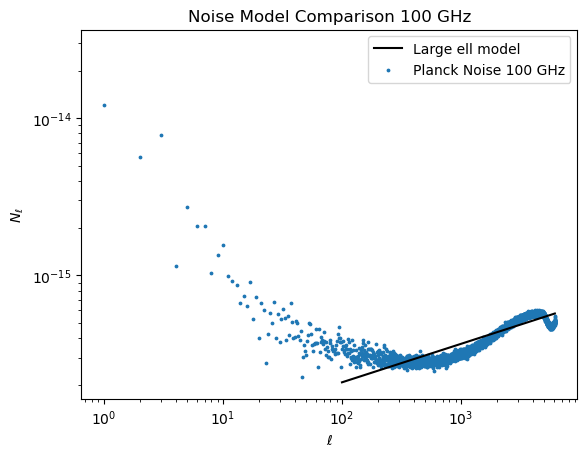

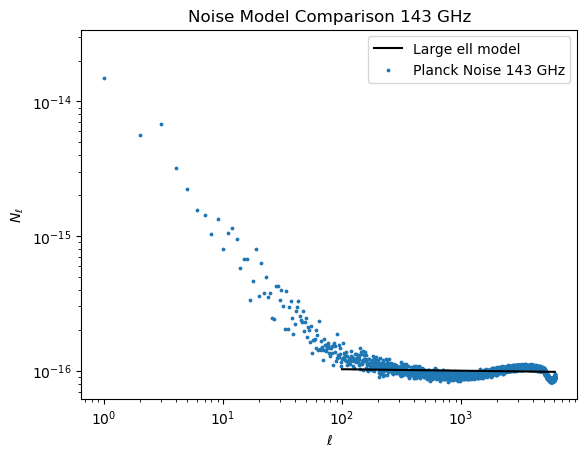

In [25]:
dot_size = 3

for frequency in frequencys:
    ps = planck_noise_spectra[f'{frequency}'][2:]
    ells_2 = np.arange(len(ps))
    #plt.plot(ells_2[2:scale_cut], one_over_f(ells_2[2:scale_cut], *upper_bound_1[f'{frequency}']), label='One over f model')
    #plt.plot(ells_2[2:scale_cut], one_over_f(ells_2[2:scale_cut], *lower_bound_1[f'{frequency}']), label='One over f model')
    #plt.plot(ells_2[scale_cut:], large_ell(ells_2[scale_cut:], *upper_bound_2[f'{frequency}']), label='Large ell model')
    plt.plot(ells_2[scale_cut:], large_ell(ells_2[scale_cut:], *popt_list_2[f'{frequency}']), label='Large ell model', color = 'black')
    plt.scatter(ells_2, ps, s = dot_size, label=f'Planck Noise {frequency} GHz')
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('$\ell$')
    plt.ylabel('$N_{\ell}$')
    plt.title(f'Noise Model Comparison {frequency} GHz')
    plt.legend()
    plt.show()

In [26]:
pcov_list_2

{'100': array([[ 2.67651183e+06,  2.35265353e+07, -6.98962382e+04,
          2.62062303e+07, -3.69778428e+04],
        [ 2.35265353e+07,  2.07662510e+08, -2.18994074e+05,
          2.30134098e+08, -3.10552340e+05],
        [-6.98962382e+04, -2.18994074e+05,  1.82939580e+05,
         -7.85072818e+05,  7.59119188e+03],
        [ 2.62062303e+07,  2.30134098e+08, -7.85072818e+05,
          2.56647473e+08, -3.65720533e+05],
        [-3.69778428e+04, -3.10552340e+05,  7.59119188e+03,
         -3.65720533e+05,  7.53560171e+02]]),
 '143': array([[ 1.17889905e+05,  3.84041571e+06, -4.13782657e+04,
          4.22262523e+06, -1.86535196e+03],
        [ 3.84041571e+06,  1.30014172e+08,  1.20626648e+06,
          1.36423479e+08, -3.60337325e+04],
        [-4.13782657e+04,  1.20626648e+06,  1.34506347e+06,
         -2.07526742e+06,  1.35268409e+04],
        [ 4.22262523e+06,  1.36423479e+08, -2.07526742e+06,
          1.51517072e+08, -7.25286603e+04],
        [-1.86535196e+03, -3.60337325e+04,  1.35

In [27]:
def noise_model(ell, ell_c, alpha, beta, gamma, delta, A, B):
    n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
    return n_ell

# Define the objective function using log squared error
def objective_function(params, ell, data_y):
    model_y = noise_model(ell, *params)
    log_square_error = np.mean((np.log(data_y) - np.log(model_y)) ** 2)
    return log_square_error

# Example data (replace with actual data)
ell = np.linspace(2, 6144, 6142)
data_y = planck_noise_spectra['100'][2:]

# Bounds obtained from curve_fit results
frequency = '100'  # example frequency

popt_1 = popt_list_1[frequency]
popt_2 = popt_list_2[frequency]
std_1 = std_list_1[frequency]
std_2 = std_list_2[frequency]

# Define parameter bounds based on popt and std values
param_bounds = [
    (popt_1[0] - 5 * std_1[0], popt_1[0] + 5 * std_1[0]),  # ell_c
    (popt_1[1] - 5 * std_1[1], popt_1[1] + 5 * std_1[1]),  # alpha
    (popt_2[0] - 5 * std_2[0], popt_2[0] + 5 * std_2[0]),  # beta
    (popt_2[1] - 5 * std_2[1], popt_2[1] + 5 * std_2[1]),  # gamma
    (popt_2[2] - 5 * std_2[2], popt_2[2] + 5 * std_2[2]),  # delta
    (popt_2[3] - 5 * std_2[3], popt_2[3] + 5 * std_2[3]),  # A
    (popt_2[4] - 5 * std_2[4], popt_2[4] + 5 * std_2[4]),  # B
]

print("Parameter bounds:", param_bounds)

# Define the number of steps for the grid search
steps = 50

# Generate parameter ranges for the grid search
param_ranges = [
    np.linspace(param_bounds[0][0], param_bounds[0][1], steps),
    np.linspace(param_bounds[1][0], param_bounds[1][1], steps),
    np.linspace(param_bounds[2][0], param_bounds[2][1], steps),
    np.linspace(param_bounds[3][0], param_bounds[3][1], steps),
    np.linspace(param_bounds[4][0], param_bounds[4][1], steps),
    np.linspace(param_bounds[5][0], param_bounds[5][1], steps),
    np.linspace(param_bounds[6][0], param_bounds[6][1], steps),
]

# Generate all combinations of parameters for the grid search
param_combinations = list(itertools.product(*param_ranges))

# Perform grid search
best_params = None
best_log_square_error = float('inf')

for params in param_combinations:
    log_square_error = objective_function(params, ell, data_y)
    if log_square_error < best_log_square_error:
        best_log_square_error = log_square_error
        best_params = params

# Output the best parameters and the corresponding log squared error
print("Best parameters:", best_params)
print("Best log squared error:", best_log_square_error)

Parameter bounds: [(5.081936093253588e-19, 3.334243500905215e-17), (1.6381084140490738, 2.1537243077486066), (-8180.015957762568, 8180.032436514223), (-72049.82438013895, 72055.17551514428), (-2137.666926665876, 2139.4767488841794), (-80098.41743910994, 80103.78994268645), (-137.25203345973745, 137.25847099714258)]


: 

In [28]:
# Define the noise model function
def noise_model(ell, params):
    ell_c, alpha, beta, gamma, delta, A, B = params
    n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
    return n_ell

# Define the objective function using log squared error
def objective_function(params, ell, data_y):
    model_y = noise_model(ell, params)
    log_square_error = np.sum((np.log(data_y) - np.log(model_y)) ** 2)
    return log_square_error

def one_over_f(ell, A, alpha):
    N_ell = A*(100/ell)**alpha
    return N_ell

def large_ell(ell, B, beta, gamma, delta, ell_c):
    N_ell = B*((ell/1000)**beta)/(1 + (ell/ ell_c)**gamma)**delta
    return N_ell

planck_noise_path = {'30' : '/home/yunan/planck_release/ffp10_noise_030_full_map_mc_00000.fits',
                     '100': '/home/yunan/planck_release/ffp10_noise_100_full_map_mc_00000.fits',
                     '143': '/home/yunan/planck_release/ffp10_noise_143_full_map_mc_00000.fits',}
planck_noise_map = {}
for frequency in planck_noise_path:
    planck_noise_map[frequency] = hp.read_map(planck_noise_path[frequency])

frequencys = [100, 143]
planck_noise_spectra = {}
for frequency in frequencys:
    planck_noise_spectra[f'{frequency}'] = hp.anafast(planck_noise_map[f'{frequency}'])

# Example data (replace with actual data)
ell = np.linspace(2, 6144, 6142)
data_y = planck_noise_spectra['100'][2:]

scale_cut_list = {'100': 92, 
                  '143': 13}

popt_list_1 = {}
pcov_list_1 = {}
std_list_1 = {}
upper_bound_1 = {}
lower_bound_1 = {}

popt_list_2 = {}
pcov_list_2 = {}
std_list_2 = {}
upper_bound_2 = {}
lower_bound_2 = {}
best_params_list = {}

for frequency in frequencys:
    ps = planck_noise_spectra[f'{frequency}'][2:]
    ells_2 = np.arange(len(ps))
    popt_1, pcov_1 = curve_fit(one_over_f, ells_2[2:scale_cut_list[f'{frequency}']], ps[:scale_cut_list[f'{frequency}']-2], maxfev = 500000)
    popt_2, pcov_2 = curve_fit(large_ell, ells_2[scale_cut_list[f'{frequency}']:], ps[scale_cut_list[f'{frequency}']-2:6140], maxfev = 500000)
    popt_list_1[f'{frequency}'] = popt_1
    popt_list_2[f'{frequency}'] = popt_2
    pcov_list_1[f'{frequency}'] = pcov_1
    pcov_list_2[f'{frequency}'] = pcov_2
    std_list_1[f'{frequency}'] = np.sqrt(np.diag(pcov_1))
    std_list_2[f'{frequency}'] = np.sqrt(np.diag(pcov_2))
    upper_bound_1[f'{frequency}'] = popt_1 + 5 * std_list_1[f'{frequency}'][0]
    lower_bound_1[f'{frequency}'] = popt_1 - 5 * std_list_1[f'{frequency}'][0]
    upper_bound_2[f'{frequency}'] = popt_2 + 5 * std_list_2[f'{frequency}'][0]
    lower_bound_2[f'{frequency}'] = popt_2 - 5 * std_list_2[f'{frequency}'][0]


# Bounds obtained from curve_fit results
frequency = '100'  # example frequency

popt_1 = popt_list_1[frequency]
popt_2 = popt_list_2[frequency]
std_1 = std_list_1[frequency]
std_2 = std_list_2[frequency]

# Define parameter bounds based on popt and std values
param_bounds = [
    (popt_1[0] - 5 * std_1[0], popt_1[0] + 5 * std_1[0]),  # ell_c
    (popt_1[1] - 5 * std_1[1], popt_1[1] + 5 * std_1[1]),  # alpha
    (popt_2[0] - 5 * std_2[0], popt_2[0] + 5 * std_2[0]),  # beta
    (popt_2[1] - 5 * std_2[1], popt_2[1] + 5 * std_2[1]),  # gamma
    (popt_2[2] - 5 * std_2[2], popt_2[2] + 5 * std_2[2]),  # delta
    (popt_2[3] - 5 * std_2[3], popt_2[3] + 5 * std_2[3]),  # A
    (popt_2[4] - 5 * std_2[4], popt_2[4] + 5 * std_2[4]),  # B
]

print("Parameter bounds:", param_bounds)

# Define the number of random samples for the search
num_samples = 50000

# Generate random parameter samples within the bounds
param_samples = np.array([
    np.random.uniform(low=param_bounds[i][0], high=param_bounds[i][1], size=num_samples)
    for i in range(len(param_bounds))
]).T

# Perform the random search
best_params = None
best_log_square_error = float('inf')

for params in param_samples:
    log_square_error = objective_function(params, ell, data_y)
    if log_square_error < best_log_square_error:
        best_log_square_error = log_square_error
        best_params = params

# Output the best parameters and the corresponding log squared error
best_params_list[f'{frequency}'] = best_params
print("Best parameters:", best_params)
print("Best log squared error:", best_log_square_error)

/tmp/ipykernel_36521/4275803877.py:18: RuntimeWarning: invalid value encountered in power
  N_ell = B*((ell/1000)**beta)/(1 + (ell/ ell_c)**gamma)**delta


Parameter bounds: [(7.143036594947574e-20, 3.3511376623649594e-17), (1.6333911690969614, 2.162653348307625), (-0.26309325766032576, 0.2630937754686129), (-70958.04599263977, 70961.61772081383), (-4091.528812888326, 4093.2983537213804), (-80473.99551575482, 80477.48326087644), (-136.97554035076567, 136.9792308410741)]


/tmp/ipykernel_36521/4275803877.py:4: RuntimeWarning: overflow encountered in power
  n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
/tmp/ipykernel_36521/4275803877.py:10: RuntimeWarning: invalid value encountered in log
  log_square_error = np.sum((np.log(data_y) - np.log(model_y)) ** 2)
/tmp/ipykernel_36521/4275803877.py:4: RuntimeWarning: divide by zero encountered in divide
  n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta


Best parameters: [1.13487387e-18 2.07968893e+00 1.47147733e-01 1.08945836e+04
 2.43492983e+03 3.18569540e+01 5.23181371e+01]
Best log squared error: 6438338.202743968


In [29]:
# Bounds obtained from curve_fit results
frequency = '143'  # example frequency

popt_1 = popt_list_1[frequency]
popt_2 = popt_list_2[frequency]
std_1 = std_list_1[frequency]
std_2 = std_list_2[frequency]

# Define parameter bounds based on popt and std values
param_bounds = [
    (popt_1[0] - 5 * std_1[0], popt_1[0] + 5 * std_1[0]),  # ell_c
    (popt_1[1] - 5 * std_1[1], popt_1[1] + 5 * std_1[1]),  # alpha
    (popt_2[0] - 5 * std_2[0], popt_2[0] + 5 * std_2[0]),  # beta
    (popt_2[1] - 5 * std_2[1], popt_2[1] + 5 * std_2[1]),  # gamma
    (popt_2[2] - 5 * std_2[2], popt_2[2] + 5 * std_2[2]),  # delta
    (popt_2[3] - 5 * std_2[3], popt_2[3] + 5 * std_2[3]),  # A
    (popt_2[4] - 5 * std_2[4], popt_2[4] + 5 * std_2[4]),  # B
]

print("Parameter bounds:", param_bounds)

# Define the number of random samples for the search
num_samples = 50000

# Generate random parameter samples within the bounds
param_samples = np.array([
    np.random.uniform(low=param_bounds[i][0], high=param_bounds[i][1], size=num_samples)
    for i in range(len(param_bounds))
]).T

# Perform the random search
best_params = None
best_log_square_error = float('inf')

for params in param_samples:
    log_square_error = objective_function(params, ell, data_y)
    if log_square_error < best_log_square_error:
        best_log_square_error = log_square_error
        best_params = params

# Output the best parameters and the corresponding log squared error
best_params_list[f'{frequency}'] = best_params
print("Best parameters:", best_params)
print("Best log squared error:", best_log_square_error)

Parameter bounds: [(-3.0786016904481636e-17, 8.024468125270174e-17), (1.1809375727941207, 2.379750719470126), (-0.0025415643776649783, 0.002541566156214654), (-171362.96873554232, 171364.7156855801), (-60165.1315113364, 60167.18935262533), (-172757.19862223763, 172759.18806417033), (-132.5181247725313, 132.51849125242725)]


/tmp/ipykernel_36521/4275803877.py:4: RuntimeWarning: invalid value encountered in power
  n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
/tmp/ipykernel_36521/4275803877.py:4: RuntimeWarning: overflow encountered in power
  n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
/tmp/ipykernel_36521/4275803877.py:4: RuntimeWarning: divide by zero encountered in divide
  n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
/tmp/ipykernel_36521/4275803877.py:10: RuntimeWarning: invalid value encountered in log
  log_square_error = np.sum((np.log(data_y) - np.log(model_y)) ** 2)


Best parameters: [ 4.71422859e-17  2.27987788e+00 -1.92653241e-03  7.07158854e+04
  7.46778667e+03  1.61508318e+02  1.07590648e+02]
Best log squared error: 6846357.228145685


/tmp/ipykernel_36521/1828753659.py:6: RuntimeWarning: overflow encountered in power
  n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta


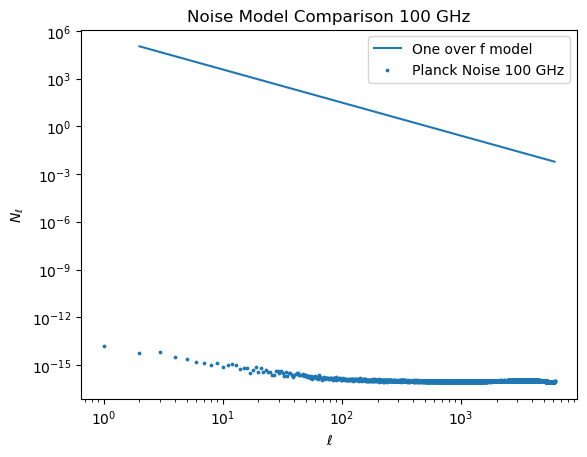

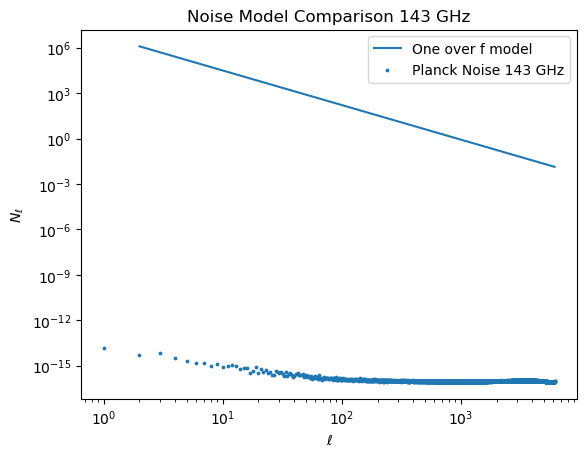

In [30]:
# best_params_list = {'100': np.array([2.99702325e-17, 1.92392439e+00, 2.20025823e+02, 6.47762058e+04, 1.52712689e+03, 2.17958415e+03, 1.35035448e+01]),
#                     '143': np.array([4.09554774e-17, 1.63117990e+00, 1.31341390e+02, 5.01773881e+04, 4.43269744e+03, 3.76726910e+02, 1.78970241e+01])
# }

def noise_model(ell, ell_c, alpha, beta, gamma, delta, A, B):
    n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
    return n_ell

dot_size = 3

for frequency in frequencys:
    plt.plot(ells_2[2:], noise_model(ells_2[2:], *best_params_list[f'{frequency}']), label='One over f model')
    plt.scatter(ells_2, ps, s = dot_size, label=f'Planck Noise {frequency} GHz')
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('$\ell$')
    plt.ylabel('$N_{\ell}$')
    plt.title(f'Noise Model Comparison {frequency} GHz')
    plt.legend()
    plt.show()

In [21]:
from skopt import gp_minimize
from skopt.space import Real

In [22]:
# Define the noise model function
def noise_model(ell, params):
    ell_c, alpha, beta, gamma, delta, A, B = params
    n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
    return n_ell

# Define the objective function using log squared error
def objective_function(params):
    model_y = noise_model(ell, params)
    log_square_error = np.mean((np.log(data_y) - np.log(model_y)) ** 2)
    return log_square_error

# Example data (replace with actual data)
ell = np.linspace(2, 6144, 6142)
data_y = planck_noise_spectra['100'][2:]
best_params_list = {}

# Bounds obtained from curve_fit results
frequency = '100'  # example frequency

popt_1 = popt_list_1[frequency]
popt_2 = popt_list_2[frequency]
std_1 = std_list_1[frequency]
std_2 = std_list_2[frequency]

# Define parameter bounds based on popt and std values
param_bounds = [
    Real(popt_1[0] - 5 * std_1[0], popt_1[0] + 5 * std_1[0]),  # ell_c
    Real(popt_1[1] - 5 * std_1[1], popt_1[1] + 5 * std_1[1]),  # alpha
    Real(popt_2[0] - 5 * std_2[0], popt_2[0] + 5 * std_2[0]),  # beta
    Real(popt_2[1] - 5 * std_2[1], popt_2[1] + 5 * std_2[1]),  # gamma
    Real(popt_2[2] - 5 * std_2[2], popt_2[2] + 5 * std_2[2]),  # delta
    Real(popt_2[3] - 5 * std_2[3], popt_2[3] + 5 * std_2[3]),  # A
    Real(popt_2[4] - 5 * std_2[4], popt_2[4] + 5 * std_2[4]),  # B
]

# Perform Bayesian Optimization
result = gp_minimize(objective_function, param_bounds, n_calls=100, random_state=0)

# Output the best parameters and the corresponding log squared error
best_params = result.x
best_log_square_error = result.fun


best_params_list[f'{frequency}'] = best_params
print("Best parameters:", best_params)
print("Best log squared error:", best_log_square_error)

/tmp/ipykernel_36521/230779359.py:4: RuntimeWarning: overflow encountered in power
  n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
/tmp/ipykernel_36521/230779359.py:4: RuntimeWarning: overflow encountered in multiply
  n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
/tmp/ipykernel_36521/230779359.py:4: RuntimeWarning: invalid value encountered in divide
  n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
/tmp/ipykernel_36521/230779359.py:10: RuntimeWarning: invalid value encountered in log
  log_square_error = np.mean((np.log(data_y) - np.log(model_y)) ** 2)
/tmp/ipykernel_36521/230779359.py:4: RuntimeWarning: divide by zero encountered in divide
  n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta


ValueError: Input y contains NaN.

In [24]:
def noise_model(ell, params):
    ell_c, alpha, beta, gamma, delta, A, B = params
    n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
    return n_ell

# Define the objective function using log squared error
def objective_function(params):
    model_y = noise_model(ell, params)
    # Handle NaN values in the model output
    if np.any(np.isnan(model_y)):
        return np.inf  # Return a large error if model output is NaN
    log_square_error = np.mean((np.log(data_y) - np.log(model_y)) ** 2)
    # Handle NaN values in the error computation
    if np.isnan(log_square_error):
        return np.inf  # Return a large error if log squared error is NaN
    return log_square_error

# Example data (replace with actual data)
ell = np.linspace(2, 6144, 6142)
data_y = planck_noise_spectra['100'][2:]

# Check for NaN values in data and remove them
valid_indices = ~np.isnan(data_y)
ell = ell[valid_indices]
data_y = data_y[valid_indices]

# Bounds obtained from curve_fit results
frequency = '100'  # example frequency

popt_1 = popt_list_1[frequency]
popt_2 = popt_list_2[frequency]
std_1 = std_list_1[frequency]
std_2 = std_list_2[frequency]

# Define parameter bounds based on popt and std values
param_bounds = [
    Real(popt_1[0] - 5 * std_1[0], popt_1[0] + 5 * std_1[0]),  # ell_c
    Real(popt_1[1] - 5 * std_1[1], popt_1[1] + 5 * std_1[1]),  # alpha
    Real(popt_2[0] - 5 * std_2[0], popt_2[0] + 5 * std_2[0]),  # beta
    Real(popt_2[1] - 5 * std_2[1], popt_2[1] + 5 * std_2[1]),  # gamma
    Real(popt_2[2] - 5 * std_2[2], popt_2[2] + 5 * std_2[2]),  # delta
    Real(popt_2[3] - 5 * std_2[3], popt_2[3] + 5 * std_2[3]),  # A
    Real(popt_2[4] - 5 * std_2[4], popt_2[4] + 5 * std_2[4]),  # B
]

# Perform Bayesian Optimization
result = gp_minimize(objective_function, param_bounds, n_calls=100, random_state=0)

# Output the best parameters and the corresponding log squared error
best_params = result.x
best_log_square_error = result.fun

print("Best parameters:", best_params)
print("Best log squared error:", best_log_square_error)

/tmp/ipykernel_36521/3863861153.py:3: RuntimeWarning: overflow encountered in power
  n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
/tmp/ipykernel_36521/3863861153.py:3: RuntimeWarning: overflow encountered in multiply
  n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
/tmp/ipykernel_36521/3863861153.py:3: RuntimeWarning: invalid value encountered in divide
  n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
/tmp/ipykernel_36521/3863861153.py:3: RuntimeWarning: divide by zero encountered in divide
  n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta


ValueError: Input y contains infinity or a value too large for dtype('float64').

In [38]:
#Range
# A = [7.07504189e-18, 2.67755867e-17]
# Alpha = [1.58654682e+00,1.89591636e+00   ]

In [3]:
planck_noise_path = {'0' : '/home/yunan/planck_release/ffp10_noise_100_full_map_mc_00000.fits',
                     '1' : '/home/yunan/planck_release/ffp10_noise_100_full_map_mc_00001.fits',
                     '2' : '/home/yunan/planck_release/ffp10_noise_100_full_map_mc_00002.fits',}

planck_noise_spectra = {}
planck_noise_map = {}

for seed in planck_noise_path:
    planck_noise_map[seed] = hp.read_map(planck_noise_path[seed])
    planck_noise_spectra[f'{seed}'] = hp.anafast(planck_noise_map[f'{seed}'])

In [3]:
planck_noise_path = {'0' : '/home/yunan/planck_release/ffp10_noise_100_full_map_mc_00000.fits',
                     '1' : '/home/yunan/planck_release/ffp10_noise_100_full_map_mc_00001.fits',
                     '2' : '/home/yunan/planck_release/ffp10_noise_100_full_map_mc_00002.fits',
                     '3' : '/home/yunan/planck_release/ffp10_noise_100_full_map_mc_00003.fits',
                     '4' : '/home/yunan/planck_release/ffp10_noise_100_full_map_mc_00004.fits',
                     '5' : '/home/yunan/planck_release/ffp10_noise_100_full_map_mc_00005.fits',
                     '6' : '/home/yunan/planck_release/ffp10_noise_100_full_map_mc_00006.fits',
                     '7' : '/home/yunan/planck_release/ffp10_noise_100_full_map_mc_00007.fits',
                     '8' : '/home/yunan/planck_release/ffp10_noise_100_full_map_mc_00008.fits',
                     '9' : '/home/yunan/planck_release/ffp10_noise_100_full_map_mc_00009.fits'
                     }

planck_noise_spectra = {}
planck_noise_map = {}

for seed in planck_noise_path:
    planck_noise_map[seed] = hp.read_map(planck_noise_path[seed])
    planck_noise_spectra[f'{seed}'] = hp.anafast(planck_noise_map[f'{seed}'])

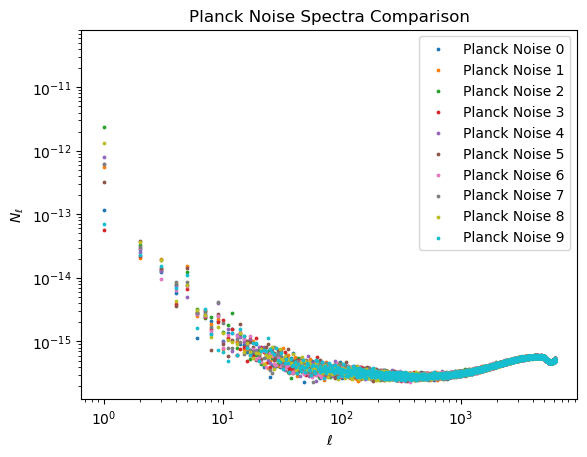

In [4]:
dot_size = 3

for seed in planck_noise_spectra:
    ps = planck_noise_spectra[f'{seed}']
    ells = np.arange(len(ps))
    plt.scatter(ells, ps, label=f'Planck Noise {seed}', s = dot_size)
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('$\ell$')
    plt.ylabel('$N_{\ell}$')
    plt.title(f'Planck Noise Spectra Comparison')
    plt.legend()
plt.show()

In [5]:
#The average of the power spectrum and standard deviation
ps_total = np.zeros(6144)
for seed in planck_noise_spectra:
    ps_total = ps_total + planck_noise_spectra[f'{seed}']

ps_average = ps_total/len(planck_noise_spectra)
ps_std = np.std([planck_noise_spectra[f'{seed}'] for seed in planck_noise_spectra], axis = 0)

In [11]:
def noise_model(ell, ell_c, alpha, beta, gamma, delta, A, B):
    n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
    return n_ell

def objective_function(params):
    model_y = noise_model(ell, *params)
    loglike = -np.sum((ps_average - model_y) ** 2/(2 * ps_std**2))
    return loglike

popt_list = {}
pcov_list = {}
#Fit the average power spectrum
for seed in planck_noise_spectra:
    ps = planck_noise_spectra[f'{seed}']
    ells_2 = np.arange(len(planck_noise_spectra[f'{seed}']))
    popt, pcov = curve_fit(noise_model, ells_2[2:], ps[2:], maxfev = 5000000)
    popt_list[f'{seed}'] = popt
    pcov_list[f'{seed}'] = pcov
    print(popt)

popt, pcov = curve_fit(noise_model, ells_2[2:], ps_average[2:], maxfev = 5000000)
popt_list['average'] = popt
pcov_list['average'] = pcov

[9.21526879e+01 1.85794293e+00 2.34682283e-01 1.47763124e-06
 1.95499578e+01 1.93578004e-17 2.85518495e-10]


/tmp/ipykernel_1939/1789127142.py:2: RuntimeWarning: invalid value encountered in power
  n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta


[3.43568406e+03 1.31668561e+00 3.43798226e+00 1.04427660e-01
 6.22582745e+01 1.35613679e-16 4.02328852e+01]
[2.68875561e+01 1.76871511e+00 4.39401402e-01 1.32256171e-02
 2.94494513e+01 3.12706892e-17 5.53208440e-07]
[ 1.01324066e+02  1.69484084e+00  2.35536581e-01 -1.48724200e-04
  2.15865759e+01  2.98828608e-17  1.16357694e-09]
[9.73212400e+01 1.74899274e+00 2.36133784e-01 6.91466088e-07
 2.06428563e+01 2.71376138e-17 6.07921182e-10]
[ 8.25048583e+01  1.94432731e+00  2.32396194e-01 -1.42315107e-05
  1.76014725e+01  1.80900218e-17  7.42356250e-11]
[9.37433397e+01 1.85570202e+00 2.34648749e-01 2.72729869e-07
 1.97337799e+01 1.94822395e-17 3.24589586e-10]
[2.34134824e+03 1.69231113e+00 1.77276449e+00 5.16720063e-02
 5.94333726e+01 4.21892422e-17 7.88901748e+01]
[ 8.76819383e+01  2.02291112e+00  2.32325140e-01 -1.24470574e-06
  1.81814438e+01  1.35972098e-17  1.10842818e-10]
[2.49638905e+03 1.53603756e+00 2.10928161e+00 6.28144045e-02
 5.96665829e+01 5.88932296e-17 6.19638772e+01]


In [12]:
popt_list


{'0': array([9.21526879e+01, 1.85794293e+00, 2.34682283e-01, 1.47763124e-06,
        1.95499578e+01, 1.93578004e-17, 2.85518495e-10]),
 '1': array([3.43568406e+03, 1.31668561e+00, 3.43798226e+00, 1.04427660e-01,
        6.22582745e+01, 1.35613679e-16, 4.02328852e+01]),
 '2': array([2.68875561e+01, 1.76871511e+00, 4.39401402e-01, 1.32256171e-02,
        2.94494513e+01, 3.12706892e-17, 5.53208440e-07]),
 '3': array([ 1.01324066e+02,  1.69484084e+00,  2.35536581e-01, -1.48724200e-04,
         2.15865759e+01,  2.98828608e-17,  1.16357694e-09]),
 '4': array([9.73212400e+01, 1.74899274e+00, 2.36133784e-01, 6.91466088e-07,
        2.06428563e+01, 2.71376138e-17, 6.07921182e-10]),
 '5': array([ 8.25048583e+01,  1.94432731e+00,  2.32396194e-01, -1.42315107e-05,
         1.76014725e+01,  1.80900218e-17,  7.42356250e-11]),
 '6': array([9.37433397e+01, 1.85570202e+00, 2.34648749e-01, 2.72729869e-07,
        1.97337799e+01, 1.94822395e-17, 3.24589586e-10]),
 '7': array([2.34134824e+03, 1.69231113e+

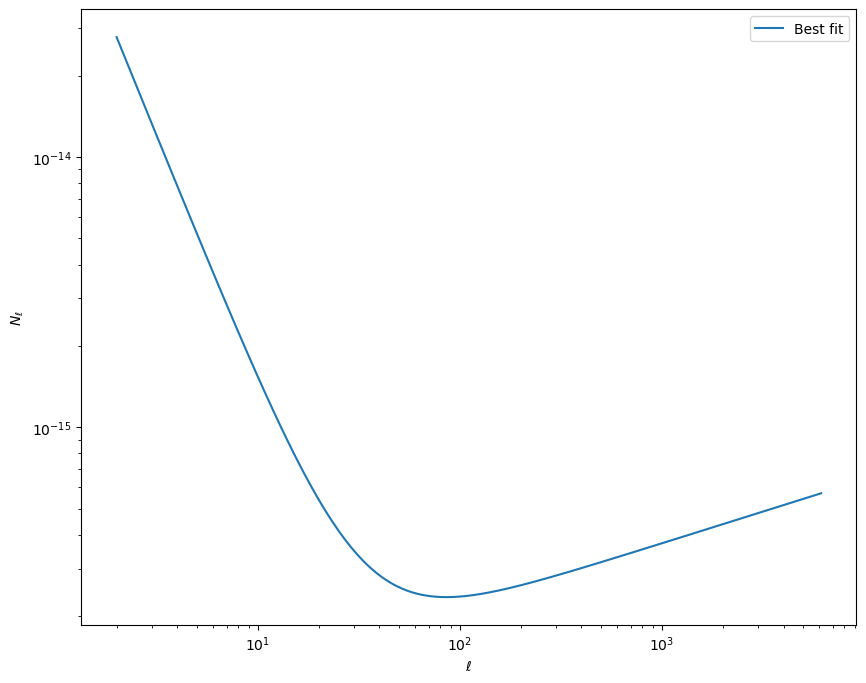

In [19]:
def noise_model(ell, ell_c, alpha, beta, gamma, delta, A, B):
    n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
    return n_ell

params = [9.25872552e+01, 1.84908306e+00, 2.35271394e-01, 2.35567354e-07, 1.97093476e+01, 2.00084811e-17, 3.18625027e-10]
ell = np.linspace(2, 6144, 6142)
plt.figure(figsize=(10, 8))
plt.plot(ell, noise_model(ell, *params), label='Best fit')
#plt.scatter(ell, ps_average, s=1, label='Data')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('$\ell$')
plt.ylabel('$N_{\ell}$')
plt.legend()
plt.show()


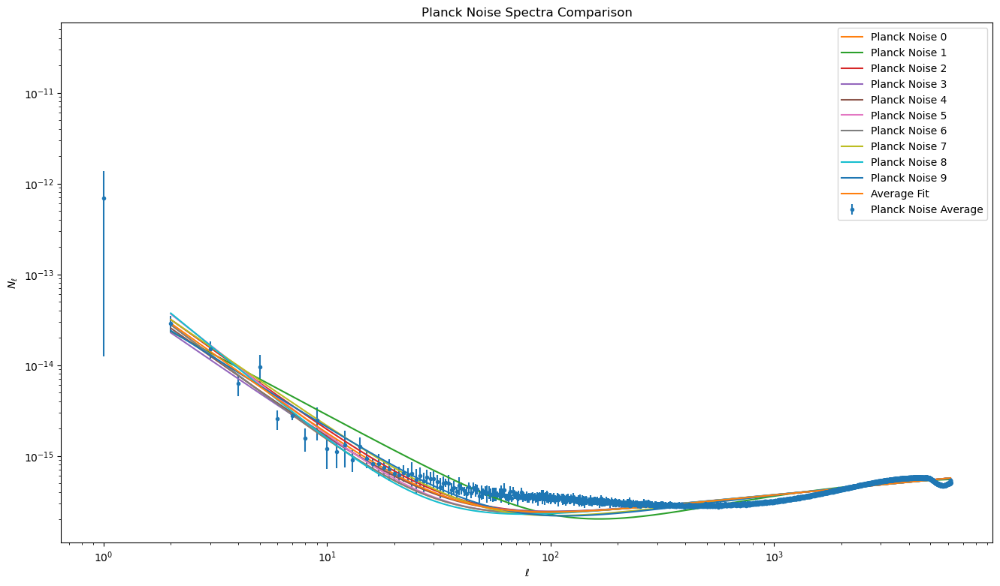

In [13]:
dot_size = 3

fig, ax = plt.subplots(1, 1, figsize=(16, 9))

ells = np.arange(len(ps_average))
plt.errorbar(ells, ps_average, yerr=ps_std, label='Planck Noise Average', fmt='o', markersize=dot_size)

for seed in planck_noise_spectra:
    ps = planck_noise_spectra[seed][2:]
    ells = np.arange(2, len(ps) + 2)
    plt.plot(ells, noise_model(ells, *popt_list[seed]), label=f'Planck Noise {seed}')

plt.plot(ells, noise_model(ells, *popt_list['average']), label='Average Fit')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('$\ell$')
plt.ylabel('$N_{\ell}$')
plt.title('Planck Noise Spectra Comparison')
plt.legend()
plt.show()

In [17]:

def noise_model(ell, *params):
    ell_c, alpha, beta, gamma, delta, A, B = params
    n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
    return n_ell

def likelihood_func(params, ell, data_y, data_std):
    model_y = noise_model(ell, *params)
    loglike = -np.sum((data_y - model_y) ** 2 / (2 * data_std**2))
    return loglike

def mcmc_sampler(likelihood, initial_params, x, y, data_std, steps=10000, step_vec=[0.1], 
                 convergence_threshold=1e-6, convergence_steps=1000, check_interval=100, burn_in=1000):
    params = np.array(initial_params)
    samples = [params]
    likelihoods = [likelihood(params, x, y, data_std)]
    stable_count = 0

    for step in range(steps):
        new_params = params + np.random.randn(len(params)) * step_vec
        new_likelihood = likelihood(new_params, x, y, data_std)
        old_likelihood = likelihood(params, x, y, data_std)

        if np.random.rand() < np.exp(new_likelihood - old_likelihood):
            params = new_params
            likelihoods.append(new_likelihood)
            samples.append(params)
        else:
            likelihoods.append(old_likelihood)
            samples.append(params)
        
        if step > 0 and step % check_interval == 0:
            recent_samples = np.array(samples[-check_interval:])
            param_change = np.mean(np.abs(np.diff(recent_samples, axis=0)), axis=0)
            change = np.mean(param_change)

            if change < convergence_threshold:
                stable_count += 1
            else:
                stable_count = 0

            if stable_count >= convergence_steps:
                print(f"Convergence reached after {step} steps.")
                break
    
    return np.array(samples[burn_in:]), np.array(likelihoods[burn_in:])

initial_params_dict = popt_list
steps = 500000
step_vec = [1e0, 1e-3, 1e-1, 1e-3, 1e0, 1e-19, 1e-13]

ps = ps_average[2:]
samples, likelihoods = mcmc_sampler(likelihood_func, initial_params_dict['4'], ells_2[2:], ps, ps_std[2:], steps=steps, step_vec=step_vec)
print(samples[-1])

/tmp/ipykernel_1939/15657657.py:23: RuntimeWarning: overflow encountered in exp
  if np.random.rand() < np.exp(new_likelihood - old_likelihood):


Convergence reached after 279800 steps.
[1.00370955e+02 1.74892451e+00 2.51695987e-01 2.92673032e-03
 2.05465385e+01 2.66417879e-17 6.08126780e-10]


In [60]:
print(likelihoods[-3:-1])

[-4352757.34939122 -4352757.34939122]


In [25]:
for seed in popt_list:
    print( 'The best fit parameters for seed', seed, 'are:', '\n',
        popt_list[f'{seed}'], '\n',
        'The standard deviation of the parameters are:', '\n',
        np.sqrt(np.diag(pcov_list[f'{seed}'])))


The best fit parameters for seed 0 are: 
 [9.25872552e+01 1.84908306e+00 2.35271394e-01 2.35567354e-07
 1.97093476e+01 2.00084811e-17 3.18625027e-10] 
 The standard deviation of the parameters are: 
 [2.41885470e+06 7.23618478e-03 6.14557459e-02 3.24599031e-03
 4.44604083e+05 5.42151073e-19 9.81926374e-05]
The best fit parameters for seed 1 are: 
 [3.42134403e+03 1.31668601e+00 3.44809128e+00 1.04116987e-01
 6.26245049e+01 1.35613494e-16 5.19194466e+01] 
 The standard deviation of the parameters are: 
 [5.67576455e+05 1.27591190e-02 2.18056673e+02 7.79222413e+00
 9.38990661e+03 6.36322907e-18 2.98300762e+05]
The best fit parameters for seed 2 are: 
 [1.45530907e-12 1.75825073e+00 8.54552416e-01 2.68342048e-02
 3.19072035e+01 3.25245114e-17 8.55626822e+01] 
 The standard deviation of the parameters are: 
 [3.71645234e-08 1.09818377e-02 3.73296037e+02 1.02107685e+01
 2.83066682e+04 1.38931399e-18 3.66947096e+06]
The best fit parameters for seed 3 are: 
 [1.08278075e+02 1.69467971e+00 2.3

/tmp/ipykernel_1939/15657657.py:3: RuntimeWarning: divide by zero encountered in divide
  n_ell = A * (100 / ell) ** alpha + B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta


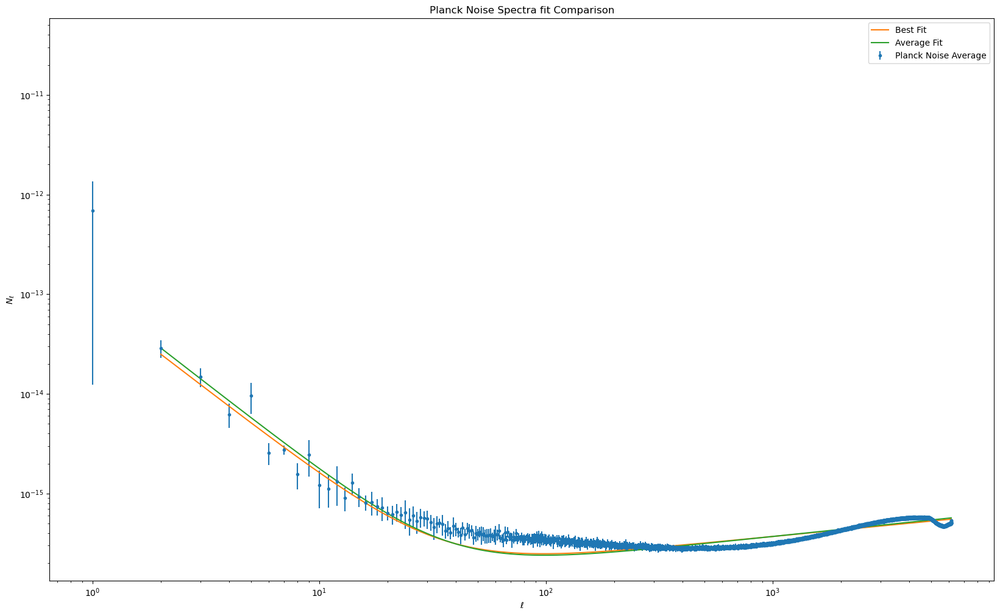

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(20, 12))
ells = np.arange(len(ps_average))
plt.errorbar(ells, ps_average, yerr = ps_std, label='Planck Noise Average', fmt='o', markersize=dot_size)
plt.plot(ells[2:], noise_model(ells, *samples[-1])[2:], label='Best Fit')
plt.plot(ells[2:], noise_model(ells, *popt_list['average'])[2:], label='Average Fit')
# for seed in popt_list:
#     ells = np.arange(2, len(ps_average)+2)
#     plt.plot(ells, noise_model(ells, *popt_list[f'{seed}']), label=f'Planck Noise {seed}')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.xlabel('$\ell$')
plt.ylabel('$N_{\ell}$')
plt.title(f'Planck Noise Spectra fit Comparison')
plt.show()

In [14]:
def chi2(y, y_pred, sigma = None):
    if sigma is None:
        sigma = np.ones_like(y)
    return np.sum((y - y_pred)**2 / sigma**2)

chi2_list = {}
for seed in planck_noise_spectra:
    ps = planck_noise_spectra[f'{seed}'][2:]
    ells = np.arange(2, len(ps) + 2)
    chi2_list[f'{seed}'] = chi2(ps, noise_model(ells, *popt_list[f'{seed}']))

In [22]:
chi2_list['sampling_best_fit'] = chi2(ps_average[2:], noise_model(ells[2:], *samples[-1]), ps_std[2:])
chi2_list['curve_fit_best_fit'] = chi2(ps_average[2:], noise_model(ells[2:], *popt_list['average']), ps_std[2:])

In [20]:
noise_model(ells[2:], *samples[-1]).size

6142

In [15]:
chi2_list

{'0': 3.7150843771251144e-29,
 '1': 1.6318738793846832e-28,
 '2': 6.607697235764881e-29,
 '3': 3.6752510938089853e-29,
 '4': 2.46349770190643e-29,
 '5': 1.3548489283690773e-28,
 '6': 4.035151273463562e-29,
 '7': 4.2786625267585735e-29,
 '8': 5.586536877797336e-29,
 '9': 6.957424605843195e-29}

In [89]:
def one_over_f(ell,*params):
    A, alpha = params
    N_ell = A*(100/ell)**alpha
    return N_ell

def large_ell(ell, *parms):
    B, beta, gamma, delta, ell_c = parms
    N_ell = B*((ell/1000)**beta)/(1 + (ell/ ell_c)**gamma)**delta
    return N_ell

In [98]:
def one_over_f(ell, A, alpha):
    N_ell = A * (100 / ell) ** alpha
    return N_ell

def large_ell(ell, B, beta, gamma, delta, ell_c):
    N_ell = B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
    return N_ell

scale_cut = 50

popt_list_1 = {}
pcov_list_1 = {}
std_list_1 = {}

popt_list_2 = {}
pcov_list_2 = {}
std_list_2 = {}

for seed in planck_noise_spectra:
    ps = planck_noise_spectra[f'{seed}'][2:]
    ells_2 = np.arange(len(ps))
    
    popt_1, pcov_1 = curve_fit(one_over_f, ells_2[2:scale_cut], ps[:scale_cut-2], maxfev=500000)
    popt_2, pcov_2 = curve_fit(large_ell, ells_2[scale_cut:], ps[scale_cut-2:6140], maxfev=500000)
    
    popt_list_1[f'{seed}'] = popt_1
    pcov_list_1[f'{seed}'] = pcov_1
    std_list_1[f'{seed}'] = np.sqrt(np.diag(pcov_1))
    
    popt_list_2[f'{seed}'] = popt_2
    pcov_list_2[f'{seed}'] = pcov_2
    std_list_2[f'{seed}'] = np.sqrt(np.diag(pcov_2))

ps = ps_average[2:]
ells_2 = np.arange(len(ps))
popt_avg_1, pcov_avg_1 = curve_fit(one_over_f, ells_2, ps, maxfev=5000000)
popt_avg_2, pcov_avg_2 = curve_fit(large_ell, ells_2, ps, maxfev=5000000)
std_1 = np.sqrt(np.diag(pcov_avg_1))
std_2 = np.sqrt(np.diag(pcov_avg_2))


/tmp/ipykernel_59385/910441423.py:6: RuntimeWarning: invalid value encountered in power
  N_ell = B * ((ell / 1000) ** beta) / (1 + (ell / ell_c) ** gamma) ** delta
/tmp/ipykernel_59385/910441423.py:2: RuntimeWarning: divide by zero encountered in divide
  N_ell = A * (100 / ell) ** alpha


RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 5000000.

In [93]:
print('best fit parameters for one over f model:', popt_avg_1)
print('standard deviation of the parameters for one over f model:', std_1)

{'0': array([1.57643413e-17, 1.91473360e+00]),
 '1': array([1.28783961e-16, 1.33103211e+00]),
 '2': array([3.58250795e-17, 1.73382479e+00])}

In [95]:
print('best fit parameters for large ell model:', popt_avg_2)
print('standard deviation of the parameters for large ell model:', std_2)

{'0': array([4.03419977e-18, 6.79503398e-02]),
 '1': array([4.83767959e-17, 1.04812872e-01]),
 '2': array([1.00623477e-17, 7.53476912e-02])}

In [ ]:
for seed in planck_noise_spectra:
    print('best fit parameters for one over f model:', popt_list_1[f'{seed}'])
    print('standard deviation of the parameters for one over f model:', std_list_1[f'{seed}'])
    print('best fit parameters for large ell model:', popt_list_2[f'{seed}'])
    print('standard deviation of the parameters for large ell model:', std_list_2[f'{seed}']})

In [4]:
ellmax = 1534
ellpeaks = [0, 50, 100, 150, 250, 350, 550, 650, 800, 1000, 1200, 1350, 1535]
n_scales = len(ellpeaks)
ells = np.arange(ellmax + 1)
filts = np.zeros((n_scales, ellmax + 1))
for i in range(0, n_scales - 1):
    filt1 = np.logical_and(ells < ellpeaks[i],  ells > ellpeaks[i-1])
    filt2 = np.logical_and(ells < ellpeaks[i+1],  ells > ellpeaks[i])
    filts[i, filt1] = np.cos(np.pi/2*(ellpeaks[i] - ells[filt1])/(ellpeaks[i] - ellpeaks[i-1]))
    filts[i, filt2] = np.cos(np.pi/2*(ells[filt2] - ellpeaks[i])/(ellpeaks[i+1] - ellpeaks[i]))
    filts[i, ellpeaks[i]] = 1

i = i + 1
filt1 = np.logical_and(ells < ellpeaks[i],  ells > ellpeaks[i-1])
filts[i, filt1] = np.cos(np.pi/2*(ellpeaks[i] - ells[filt1])/(ellpeaks[i] - ellpeaks[i-1]))
    

In [5]:
assert (np.absolute( np.sum( filts**2, axis = 0) - np.ones(1535, dtype = float)) < 1e-3).all(), 'The filters are not normalized'

In [6]:
n_modes = np.zeros(n_scales, dtype = float)
for i in range(n_scales):
    n_modes[i] = np.sum(2*ells + np.ones(ellmax + 1) * filts[i]**2)
print('number of modes:', n_modes)

number of modes: [2354715.5 2354740.  2354740.  2354765.  2354790.  2354840.  2354840.
 2354815.  2354865.  2354890.  2354865.  2354857.5 2354782. ]


In [7]:
hp.nside2resol(512, arcmin = True)

6.870972823634812

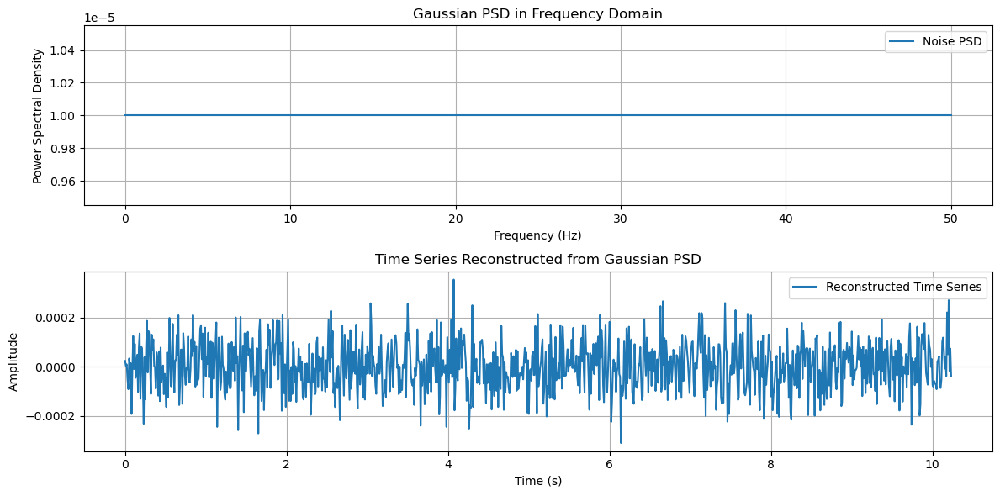

In [4]:
import numpy as np
import matplotlib.pyplot as plt

# Define the parameters for the Gaussian PSD
N = 1024  # Number of points
fs = 100  # Sampling frequency (Hz)
f = np.linspace(0, fs/2, N//2+1)  # Frequency axis for positive frequencies
sigma_f = 10  # Standard deviation in frequency domain (Hz)
mu_f = 25  # Mean of the Gaussian in frequency domain (Hz)
N_0 = 1e-5  # Noise level

# Create a Gaussian-shaped PSD in frequency domain
psd = np.ones_like(f)*N_0

# Generate random phase information for reconstruction (since PSD lacks phase info)
random_phase = np.exp(1j * 2 * np.pi * np.random.rand(len(psd)))

# Construct the frequency domain signal using magnitude (sqrt(PSD)) and random phase
frequency_domain_signal = np.sqrt(psd) * random_phase

# Apply the Inverse Fourier Transform to get the time-domain signal
time_domain_signal = np.fft.irfft(frequency_domain_signal, N)

# Time axis for the time domain signal
t = np.arange(N) / fs

# Plotting the results
plt.figure(figsize=(12, 6))

# Plot PSD
plt.subplot(2, 1, 1)
plt.plot(f, psd, label="Noise PSD")
plt.title("Gaussian PSD in Frequency Domain")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Power Spectral Density")
plt.grid(True)
plt.legend()

# Plot Time-domain signal (reconstructed)
plt.subplot(2, 1, 2)
plt.plot(t, time_domain_signal, label="Reconstructed Time Series")
plt.title("Time Series Reconstructed from Gaussian PSD")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()


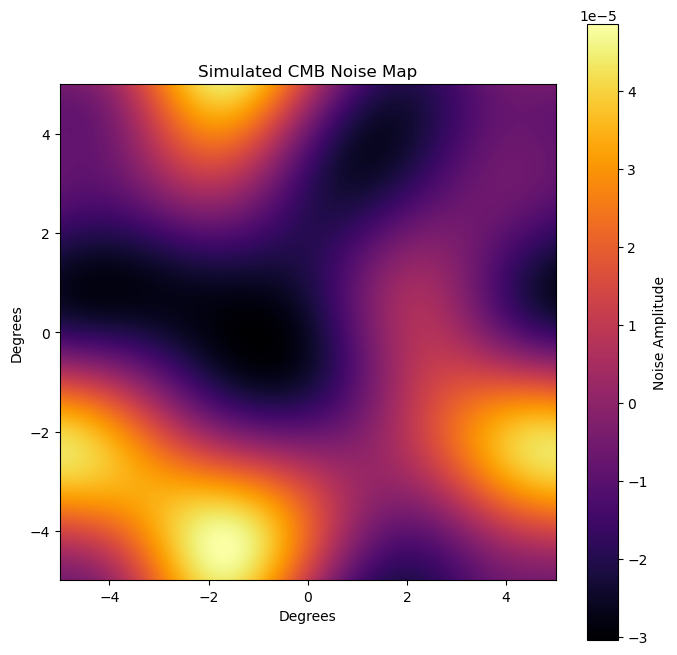

In [6]:
# Parameters for the map
map_size = 256  # Size of the map (NxN)
physical_size = 10.0  # Physical size of the map (degrees)
k_max = map_size / physical_size  # Maximum spatial frequency

# Create the grid of spatial frequencies
kx = np.fft.fftfreq(map_size, d=physical_size / map_size)
ky = np.fft.fftfreq(map_size, d=physical_size / map_size)
k_grid = np.sqrt(kx[:, np.newaxis]**2 + ky[np.newaxis, :]**2)

# Define a PSD for CMB-like noise (example)
# You can replace this with the actual PSD for your CMB noise
k_0 = 0.1  # Scale at which power peaks (in degrees^-1)
psd_cmb = (k_grid / k_0)**2 * np.exp(-(k_grid / k_0)**2)  # Example PSD
psd_cmb[k_grid == 0] = 0  # Avoid division by zero

# Generate random complex coefficients with the given PSD
random_phases = np.exp(1j * 2 * np.pi * np.random.rand(map_size, map_size))
fourier_coefficients = np.sqrt(psd_cmb) * random_phases

# Perform inverse FFT to get the noise map
cmb_noise_map = np.fft.ifft2(fourier_coefficients).real

# Plot the noise map
plt.figure(figsize=(8, 8))
plt.imshow(cmb_noise_map, extent=[-physical_size/2, physical_size/2, -physical_size/2, physical_size/2], cmap='inferno')
plt.colorbar(label='Noise Amplitude')
plt.title("Simulated CMB Noise Map")
plt.xlabel("Degrees")
plt.ylabel("Degrees")
plt.show()